# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages, which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission if necessary. 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the iPython Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission. 

In addition to implementing code, there is a writeup to complete. The writeup should be completed in a separate file, which can be either a markdown file or a pdf document. There is a [write up template](https://github.com/udacity/CarND-Traffic-Sign-Classifier-Project/blob/master/writeup_template.md) that can be used to guide the writing process. Completing the code template and writeup template will cover all of the [rubric points](https://review.udacity.com/#!/rubrics/481/view) for this project.

The [rubric](https://review.udacity.com/#!/rubrics/481/view) contains "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. The stand out suggestions are optional. If you decide to pursue the "stand out suggestions", you can include the code in this Ipython notebook and also discuss the results in the writeup file.


>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Import all necessary packages

In [1]:
import pickle
from sklearn.utils import shuffle
import numpy as np
import random
import csv
import matplotlib.pyplot as plt
%matplotlib inline
from textwrap import wrap
import cv2
import tensorflow as tf
from tensorflow.contrib.layers import flatten
import glob
import os
import matplotlib.image as mpimg
from PIL import Image as im

C:\ProgramData\Anaconda3\envs\tensorflow_GPU\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


---
## Step 0: Load The Data

In [2]:
# Load pickled data

# TODO: Fill this in based on where you saved the training and testing data

# define input files
training_file = '../../GD_GitHubData/traffic-signs-data/train.p'
validation_file = '../../GD_GitHubData/traffic-signs-data/valid.p'
testing_file = '../../GD_GitHubData/traffic-signs-data/test.p'

# load inputs from input files
with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(validation_file, mode='rb') as f:
    valid = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
# get data from inputs
X_train, y_train = train['features'], train['labels']
X_valid, y_valid = valid['features'], valid['labels']
X_test, y_test = test['features'], test['labels']

# check data consistency
assert(len(X_train) == len(y_train))
assert(len(X_valid) == len(y_valid))
assert(len(X_test) == len(y_test))

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 1D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below. Use python, numpy and/or pandas methods to calculate the data summary rather than hard coding the results. For example, the [pandas shape method](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.shape.html) might be useful for calculating some of the summary results. 

### Provide a Basic Summary of the Data Set Using Python, Numpy and/or Pandas

Number of training examples = 34799
Number of validation examples = 4410
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


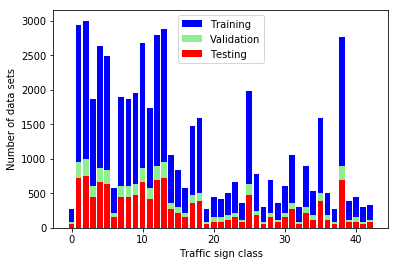

In [3]:
### Replace each question mark with the appropriate value. 
### Use python, pandas or numpy methods rather than hard coding the results

def plot_histogram(x_values, y_values, colors = None, x_label = None, y_label = None, legend = None, brelative = False):
# ...
# This function plots a histogram of the input data
# ...
# Inputs
# ...
# x_values  : categories of the data
# y_values  : list of data sequences that should be categorized
# brelative : boolean for 'relative plot'
    
    # define constants
    default_colors = ['red', 'lightgreen', 'blue']
    default_y_label_abs = 'Number of data sets'
    default_y_label_rel = 'Percentage of data sets'
    
    # initial calculations
    if not colors: colors = default_colors
    if not y_label:
        if brelative:
            y_label = default_y_label_rel
        else:
            y_label = default_y_label_abs
    
    # check input consistency
    assert(len(y_values) <= len(colors))
    if legend: assert(len(y_values) <= len(legend))
    
    # initialize variables
    amount = np.zeros(len(x_values))
    hists = []
    plots = []
    bottom = []
    
    # generate histograms
    for y_value in y_values:
        
        hist = np.histogram(y_value, len(x_values))[0]
        amount += hist
        hists.append(hist)
        
    # loop through all data sets 
    for idx, y_value in enumerate(y_values):
        
        # define relative values if needed
        if brelative:
            hist = np.divide(hists[idx], amount)
            
        else:
            hist = hists[idx]
        
        if (len(bottom) > 0):
            plot = plt.bar(x_values, hist, bottom = bottom, color = colors[idx])
            bottom += hist
        
        else:
            plot = plt.bar(x_values, hist, color = colors[idx])
            bottom = hist
            
        plots.append(plot[0])
    
    if x_label: plt.xlabel(x_label)
    plt.ylabel(y_label)
    if legend: plt.legend(plots[::-1], legend[::-1])
    plt.show()

# TODO: Number of training examples
n_train = X_train[:,0,0,0].shape[0]

# TODO: Number of validation examples
n_validation = X_valid[:,0,0,0].shape[0]

# TODO: Number of testing examples.
n_test = X_test[:,0,0,0].shape[0]

# TODO: What's the shape of an traffic sign image?
image_shape = X_train[0,:,:,:].shape if (X_train[0,:,:,:].shape == X_valid[0,:,:,:].shape == X_test[0,:,:,:].shape) else []

# TODO: How many unique classes/labels there are in the dataset.
l_classes = []
n_classes = len([l_classes.append(label) for label in np.concatenate((y_train, y_valid, y_test)) if label not in l_classes])

print("Number of training examples =", n_train)
print("Number of validation examples =", n_validation)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

plot_histogram(np.arange(n_classes), (y_test, y_valid, y_train), x_label = 'Traffic sign class', legend = ('Testing', 'Validation', 'Training'), brelative = False)

### Include an exploratory visualization of the dataset

Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc. 

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections. It can be interesting to look at the distribution of classes in the training, validation and test set. Is the distribution the same? Are there more examples of some classes than others?

Random images:


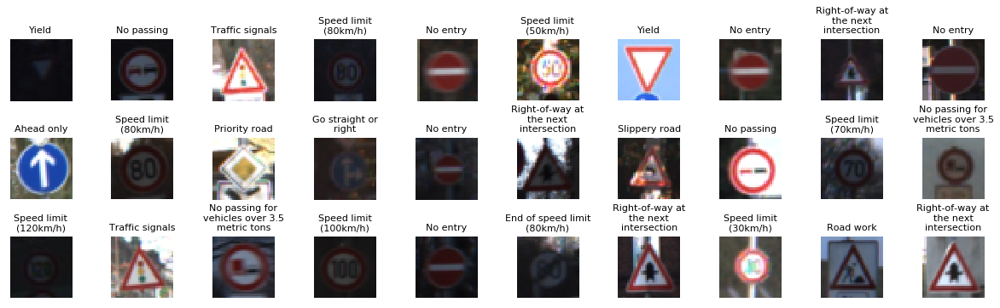

Random images of the same random label: Pedestrians


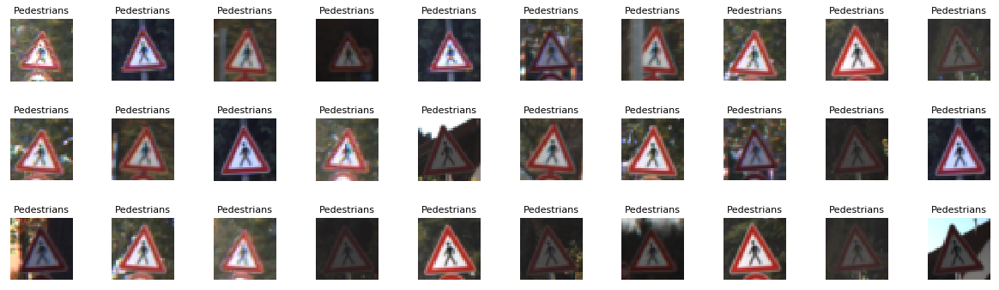

High contrast image for each label:


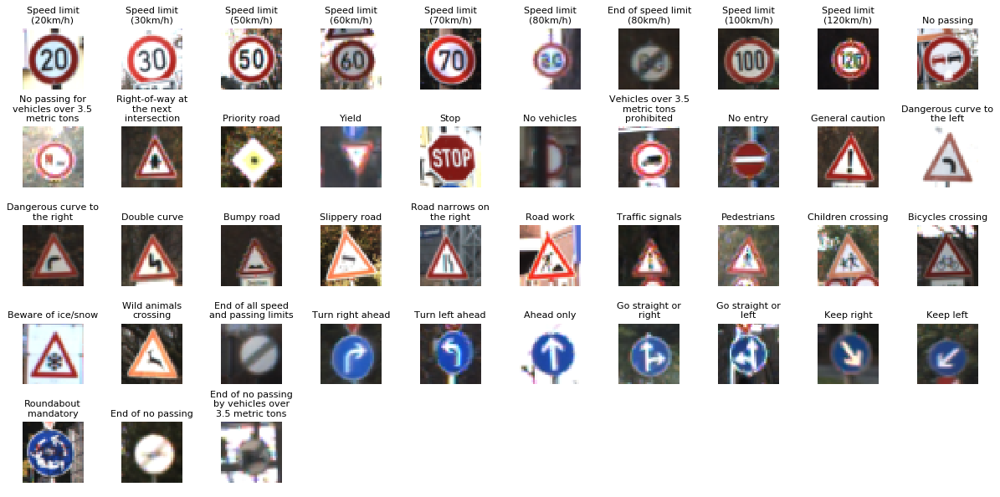

Average image for each label:


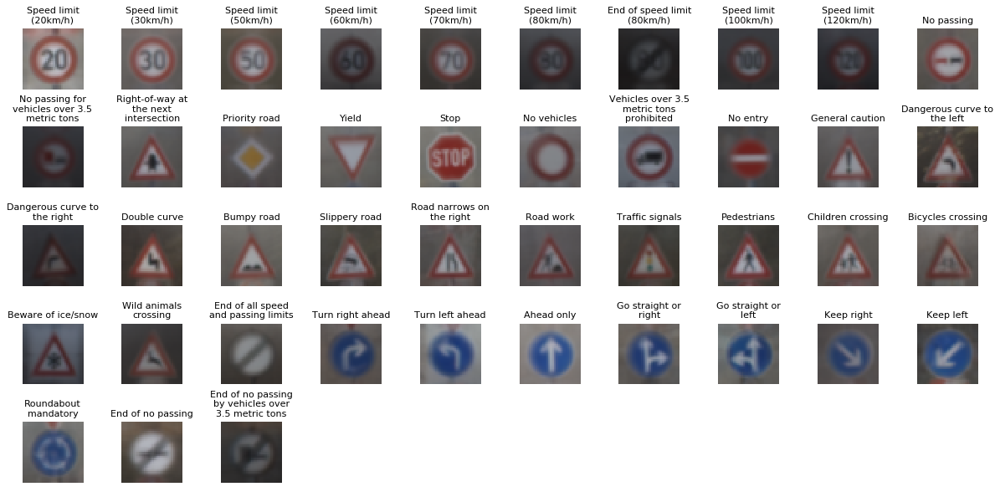

In [44]:
### Data exploration visualization code goes here.
### Feel free to use as many code cells as needed.

# Visualizations will be shown in the notebook.

# define constants
displayimages = 30

def plot_traffic_signs(images, labels, totalimages, interpolation = None, vmin = None, vmax = None, cmap = None):
# ...
# This function plots a set of traffic sign images
# ...
# Inputs
# ...
# images        : list of images
# labels        : list of image labels
# totalimages   : total number of images to plot
# interpolation : interpolation method for imshow()
# vmin          : vmin for imshow()
# vmax          : vmax for imshow()
# cmap          : cmap for imshow()
    
    # define constants
    maxhorizontalimages = 10
    dpi = 80
    minhorizontalimagesize = 6
    maxhorizontalimagesize = 15
    titlebasefontsize = 100
    titlechars_per_line = 18
    
    # initialize variables
    horizontalimages = min(totalimages, maxhorizontalimages)
    horizontalimagesize = min(maxhorizontalimagesize / minhorizontalimagesize * totalimages, maxhorizontalimagesize)
    
    # create figure with subplot
    verticalimages = np.int(np.ceil(totalimages / horizontalimages))
    verticalimagesize = (horizontalimagesize * (verticalimages / horizontalimages))
    figure, axes = plt.subplots(verticalimages, horizontalimages, figsize = (horizontalimagesize, verticalimagesize), dpi = dpi)
    figure.tight_layout()
    # figure.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
    if isinstance(axes, np.ndarray):
        axes = axes.reshape(-1)
    else:
        axes = np.asarray([axes])
    
    # plot all images
    titlefontsize = (titlebasefontsize / horizontalimages) * (horizontalimagesize / maxhorizontalimagesize)
    for idx, axis in enumerate(axes):
        
        # configure axis
        axis.set_axis_off()
        axis.get_xaxis().set_visible(False)
        axis.get_yaxis().set_visible(False)
        
        # print label and plot image
        if (len(labels) > idx):
            axis.set_title("\n".join(wrap(labels[idx], titlechars_per_line)), fontsize = titlefontsize)
            axis.imshow(images[idx, :, :], interpolation = interpolation, vmin = vmin, vmax = vmax, cmap = cmap)
    
    # make sure plot is shown
    plt.show()

# read description of labels
with open('signnames.csv') as csvfile:
    reader = csv.DictReader(csvfile)
    labeldict = dict([(np.int(row['ClassId']), row['SignName']) for row in reader])

# select and plot random images
print('Random images:')
indices = np.random.randint(0, len(X_train), displayimages)
images = X_train[indices].squeeze()
labels = [labeldict[idx] for idx in y_train[indices]]
plot_traffic_signs(images, labels, displayimages)

# select and plot random images of the same random label
label = np.random.randint(min(y_train), max(y_train), 1)
print('Random images of the same random label:', labeldict[label[0]])
images = np.asarray([image for idx, image in enumerate(X_train) if (y_train[idx] == label)])
indices = np.random.randint(0, images.shape[0], displayimages)
images = images[indices, :, :]
labels = [labeldict[label[0]] for image in images]
plot_traffic_signs(images, labels, displayimages)

# select and plot a high contrast image for each label
labelnums = np.arange(min(y_train), (max(y_train) + 1))
contrastimages = []
averageimages = []
for labelnum in labelnums:
    labelimages = np.asarray([image for idx, image in enumerate(X_train) if (y_train[idx] == labelnum)])
    grays = np.asarray([cv2.cvtColor(labelimage, cv2.COLOR_RGB2GRAY) for labelimage in labelimages])
    smalls = [gray[15:18, 15:18] for gray in grays]
    deviations = np.asarray([np.sum(np.absolute(small - np.average(small))) for small in smalls])
    contrastimages.append(labelimages[np.argmax(deviations)])
    averageimages.append(np.array(np.average(labelimages, axis = 0), dtype = np.int32))
contrastimages = np.asarray(contrastimages)
averageimages = np.asarray(averageimages)
labels = [labeldict[labelnum] for labelnum in labelnums]
print('High contrast image for each label:')
plot_traffic_signs(contrastimages, labels, len(labelnums))
print('Average image for each label:')
plot_traffic_signs(averageimages, labels, len(labelnums))

### (One could add picture transformations on the X_train dataset to improve the training)

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play! 

With the LeNet-5 solution from the lecture, you should expect a validation set accuracy of about 0.89. To meet specifications, the validation set accuracy will need to be at least 0.93. It is possible to get an even higher accuracy, but 0.93 is the minimum for a successful project submission. 

There are various aspects to consider when thinking about this problem:

- Neural network architecture (is the network over or underfitting?)
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

### Pre-process the Data Set (normalization, grayscale, etc.)

Minimally, the image data should be normalized so that the data has mean zero and equal variance. For image data, `(pixel - 128)/ 128` is a quick way to approximately normalize the data and can be used in this project. 

Other pre-processing steps are optional. You can try different techniques to see if it improves performance. 

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project.

In [5]:
### Preprocess the data here. It is required to normalize the data. Other preprocessing steps could include 
### converting to grayscale, etc.
### Feel free to use as many code cells as needed.

# normalize input data
X_train_norm = np.asarray(((X_train / 127.5) - 1), np.float32)
X_valid_norm = np.asarray(((X_valid / 127.5) - 1), np.float32)
X_test_norm = np.asarray(((X_test / 127.5) - 1), np.float32)

# ensure correct label data type
y_train_conv = np.asarray(y_train, np.int32)
y_valid_conv = np.asarray(y_valid, np.int32)
y_test_conv = np.asarray(y_test, np.int32)

### Model Architecture

In [6]:
### Define your architecture here.
### Feel free to use as many code cells as needed.

def LeNet(x, bdisplay):
# ...
# This function calculates the LeNet logits for input x
# ...
# Inputs
# ...
# x        : input image
# bdisplay : boolean for 'display information'
# ...
# Outputs
# ...
# logits : probabilities of individual classes in input image
    
    # Arguments used for tf.truncated_normal, randomly defines variables for the weights and biases for each layer
    mu = 0
    sigma = 0.1
    
    # SOLUTION: Layer 1: Convolutional. Input = 32x32x3. Output = 28x28x6.
    conv1_W = tf.Variable(tf.truncated_normal(shape = (5, 5, 3, 6), mean = mu, stddev = sigma))
    conv1_b = tf.Variable(tf.zeros(6))
    conv1   = tf.nn.conv2d(x, conv1_W, strides = [1, 1, 1, 1], padding = 'VALID') + conv1_b
    
    # display information
    if bdisplay:
        print('Conv: shape', (5, 5, 3, 6), 'zeros', 6, 'mean', mu, 'stddev', sigma)
        print('Conv: strides', [1, 1, 1, 1], 'padding', 'VALID')
        print('Conv: inp', x)
        print('Conv: W', conv1_W)
        print('Conv: b', conv1_b)
        print('Conv: out', conv1)
    
    # SOLUTION: Activation.
    conv1 = tf.nn.relu(conv1)
    
    print('Convolutional layer   1 :', [32, 32], 'input dimension with depth', 3, 'and', [28, 28], 'output dimensions with depth', 6)
    
    # SOLUTION: Pooling. Input = 28x28x6. Output = 14x14x6.
    conv1 = tf.nn.max_pool(conv1, ksize = [1, 2, 2, 1], strides = [1, 2, 2, 1], padding = 'VALID')

    # display information
    if bdisplay:
        print('Pool: filter', [1, 2, 2, 1], 'strides', [1, 2, 2, 1], 'padding', 'VALID')
        print('Pool: inp', conv1)
        print('Pool: out', conv1)
    
    print('Pooling layer         1 :', [28, 28], 'input dimension with depth', 6, 'and', [14, 14], 'output dimensions with depth', 6)
    
    # SOLUTION: Layer 2: Convolutional. Output = 10x10x16.
    conv2_W = tf.Variable(tf.truncated_normal(shape = (5, 5, 6, 16), mean = mu, stddev = sigma))
    conv2_b = tf.Variable(tf.zeros(16))
    conv2   = tf.nn.conv2d(conv1, conv2_W, strides = [1, 1, 1, 1], padding = 'VALID') + conv2_b
    
    # display information
    if bdisplay:
        print('Conv: shape', [5, 5, 6, 16], 'zeros', 16, 'mean', mu, 'stddev', sigma)
        print('Conv: strides', [1, 1, 1, 1], 'padding', 'VALID')
        print('Conv: inp', conv1)
        print('Conv: W', conv2_W)
        print('Conv: b', conv2_b)
        print('Conv: out', conv2)
    
    # SOLUTION: Activation.
    conv2 = tf.nn.relu(conv2)

    print('Convolutional layer   2 :', [14, 14], 'input dimension with depth', 6, 'and', [10, 10], 'output dimensions with depth', 16)
    
    # SOLUTION: Pooling. Input = 10x10x16. Output = 5x5x16.
    conv2 = tf.nn.max_pool(conv2, ksize = [1, 2, 2, 1], strides = [1, 2, 2, 1], padding = 'VALID')

    # display information
    if bdisplay:
        print('Pool: filter', [1, 2, 2, 1], 'strides', [1, 2, 2, 1], 'padding', 'VALID')
        print('Pool: inp', conv2)
        print('Pool: out', conv2)
    
    print('Pooling layer         2 :', [10, 10], 'input dimension with depth', 16, 'and', [5, 5], 'output dimensions with depth', 16)
    
    # SOLUTION: Flatten. Input = 5x5x16. Output = 400.
    fc0   = flatten(conv2)
    
    # SOLUTION: Layer 3: Fully Connected. Input = 400. Output = 120.
    fc1_W = tf.Variable(tf.truncated_normal(shape=(400, 120), mean = mu, stddev = sigma))
    fc1_b = tf.Variable(tf.zeros(120))
    fc1   = tf.matmul(fc0, fc1_W) + fc1_b
    
    # display information
    if bdisplay:
        print('Full: shape', [400, 120], 'zeros', 120, 'mean', mu, 'stddev', sigma)
        print('Full: inp', fc0)
        print('Full: W', fc1_W)
        print('Full: b', fc1_b)
        print('Full: fc', fc1)
    
    # SOLUTION: Activation.
    fc1    = tf.nn.relu(fc1)

    print('Fully connected layer 1 :', 400, 'input dimensions and', 120, 'output dimensions')
    
    # SOLUTION: Layer 4: Fully Connected. Input = 120. Output = 84.
    fc2_W  = tf.Variable(tf.truncated_normal(shape = (120, 84), mean = mu, stddev = sigma))
    fc2_b  = tf.Variable(tf.zeros(84))
    fc2    = tf.matmul(fc1, fc2_W) + fc2_b
    
    # display information
    if bdisplay:
        print('Full: shape', [120, 84], 'zeros', 84, 'mean', mu, 'stddev', sigma)
        print('Full: inp', fc1)
        print('Full: W', fc2_W)
        print('Full: b', fc2_b)
        print('Full: fc', fc2)
    
    # SOLUTION: Activation.
    fc2    = tf.nn.relu(fc2)

    print('Fully connected layer 2 :', 120, 'input dimensions and', 84, 'output dimensions')
    
    # SOLUTION: Layer 5: Fully Connected. Input = 84. Output = 43.
    fc3_W  = tf.Variable(tf.truncated_normal(shape = (84, 43), mean = mu, stddev = sigma))
    fc3_b  = tf.Variable(tf.zeros(43))
    logits = tf.matmul(fc2, fc3_W) + fc3_b
    
    # display information
    if bdisplay:
        print('Full: shape', [84, 43], 'zeros', 43, 'mean', mu, 'stddev', sigma)
        print('Full: inp', fc2)
        print('Full: W', fc3_W)
        print('Full: b', fc3_b)
        print('Full: fc', logits)
    
    print('Fully connected layer 3 :', 84, 'input dimensions and', 43, 'output dimensions')
    
    return logits, (conv1_W, conv2_W)

In [7]:
### Define your architecture here.
### Feel free to use as many code cells as needed.

def LeNet_adjusted(x, tf_keep_prob, bdisplay):
# ...
# This function calculates the LeNet logits for input x
# ...
# Inputs
# ...
# x        : input image
# bdisplay : boolean for 'display information'
# ...
# Outputs
# ...
# logits : probabilities of individual classes in input image
    
    # Arguments used for tf.truncated_normal, randomly defines variables for the weights and biases for each layer
    mu = 0
    sigma = 0.1
    
    # Layer 1: Convolutional. Input = 32x32x3. Output = 28x28x18.
    conv1_W = tf.Variable(tf.truncated_normal(shape = (5, 5, 3, 18), mean = mu, stddev = sigma))
    conv1_b = tf.Variable(tf.zeros(18))
    conv1   = tf.nn.conv2d(x, conv1_W, strides = [1, 1, 1, 1], padding = 'VALID') + conv1_b
    
    # display information
    if bdisplay:
        print('Conv: shape', (5, 5, 3, 18), 'zeros', 18, 'mean', mu, 'stddev', sigma)
        print('Conv: strides', [1, 1, 1, 1], 'padding', 'VALID')
        print('Conv: inp', x)
        print('Conv: W', conv1_W)
        print('Conv: b', conv1_b)
        print('Conv: out', conv1)
    
    # Activation and drop out
    conv1 = tf.nn.relu(conv1)
    conv1 = tf.nn.dropout(conv1, tf_keep_prob)
    
    print('Convolutional layer   1 :', [32, 32], 'input dimension with depth', 3, 'and', [28, 28], 'output dimensions with depth', 18)
    
    # Pooling. Input = 28x28x18. Output = 14x14x18.
    #conv1 = tf.nn.max_pool(conv1, ksize = [1, 2, 2, 1], strides = [1, 2, 2, 1], padding = 'VALID')

    # display information
    #if bdisplay:
    #    print('Pool: filter', [1, 2, 2, 1], 'strides', [1, 2, 2, 1], 'padding', 'VALID')
    #    print('Pool: inp', conv1)
    #    print('Pool: out', conv1)
    
    #print('Pooling layer         1 :', [28, 28], 'input dimension with depth', 18, 'and', [14, 14], 'output dimensions with depth', 18)
    
    # Layer 2: Convolutional. Output = 20x20x54.
    conv2_W = tf.Variable(tf.truncated_normal(shape = (9, 9, 18, 54), mean = mu, stddev = sigma))
    conv2_b = tf.Variable(tf.zeros(54))
    conv2   = tf.nn.conv2d(conv1, conv2_W, strides = [1, 1, 1, 1], padding = 'VALID') + conv2_b
    
    # display information
    if bdisplay:
        print('Conv: shape', [9, 9, 18, 54], 'zeros', 54, 'mean', mu, 'stddev', sigma)
        print('Conv: strides', [1, 1, 1, 1], 'padding', 'VALID')
        print('Conv: inp', conv1)
        print('Conv: W', conv2_W)
        print('Conv: b', conv2_b)
        print('Conv: out', conv2)
    
    # Activation and drop out
    conv2 = tf.nn.relu(conv2)
    conv2 = tf.nn.dropout(conv2, tf_keep_prob)

    print('Convolutional layer   2 :', [28, 28], 'input dimension with depth', 18, 'and', [20, 20], 'output dimensions with depth', 54)
    
    # Pooling. Input = 20x20x54. Output = 10x10x54.
    conv2 = tf.nn.max_pool(conv2, ksize = [1, 2, 2, 1], strides = [1, 2, 2, 1], padding = 'VALID')

    # display information
    if bdisplay:
        print('Pool: filter', [1, 2, 2, 1], 'strides', [1, 2, 2, 1], 'padding', 'VALID')
        print('Pool: inp', conv2)
        print('Pool: out', conv2)
    
    print('Pooling layer         2 :', [20, 20], 'input dimension with depth', 54, 'and', [10, 10], 'output dimensions with depth', 54)
    
    # Flatten. Input = 10x10x54. Output = 5400.
    fc0   = flatten(conv2)
    
    # Layer 3: Fully Connected. Input = 5400. Output = 800.
    fc1_W = tf.Variable(tf.truncated_normal(shape=(5400, 800), mean = mu, stddev = sigma))
    fc1_b = tf.Variable(tf.zeros(800))
    fc1   = tf.matmul(fc0, fc1_W) + fc1_b
    
    # display information
    if bdisplay:
        print('Full: shape', [5400, 800], 'zeros', 800, 'mean', mu, 'stddev', sigma)
        print('Full: inp', fc0)
        print('Full: W', fc1_W)
        print('Full: b', fc1_b)
        print('Full: fc', fc1)
    
    # Activation and drop out
    fc1    = tf.nn.relu(fc1)
    fc1    = tf.nn.dropout(fc1, tf_keep_prob)

    print('Fully connected layer 1 :', 5400, 'input dimensions and', 800, 'output dimensions')
    
    # Layer 4: Fully Connected. Input = 800. Output = 84.
    fc2_W  = tf.Variable(tf.truncated_normal(shape = (800, 84), mean = mu, stddev = sigma))
    fc2_b  = tf.Variable(tf.zeros(84))
    fc2    = tf.matmul(fc1, fc2_W) + fc2_b
    
    # display information
    if bdisplay:
        print('Full: shape', [800, 84], 'zeros', 84, 'mean', mu, 'stddev', sigma)
        print('Full: inp', fc1)
        print('Full: W', fc2_W)
        print('Full: b', fc2_b)
        print('Full: fc', fc2)
    
    # Activation and drop out
    fc2    = tf.nn.relu(fc2)
    fc2    = tf.nn.dropout(fc2, tf_keep_prob)

    print('Fully connected layer 2 :', 800, 'input dimensions and', 84, 'output dimensions')
    
    # Layer 5: Fully Connected. Input = 84. Output = 43.
    fc3_W  = tf.Variable(tf.truncated_normal(shape = (84, 43), mean = mu, stddev = sigma))
    fc3_b  = tf.Variable(tf.zeros(43))
    logits = tf.matmul(fc2, fc3_W) + fc3_b
    
    # display information
    if bdisplay:
        print('Full: shape', [84, 43], 'zeros', 43, 'mean', mu, 'stddev', sigma)
        print('Full: inp', fc2)
        print('Full: W', fc3_W)
        print('Full: b', fc3_b)
        print('Full: fc', logits)
    
    print('Fully connected layer 3 :', 84, 'input dimensions and', 43, 'output dimensions')
    
    return logits, (conv1_W, conv2_W)

In [8]:
### Define your architecture here.
### Feel free to use as many code cells as needed.

def LeNet_adjusted3(x, tf_keep_prob, bdisplay):
# ...
# This function calculates the LeNet logits for input x
# ...
# Inputs
# ...
# x        : input image
# bdisplay : boolean for 'display information'
# ...
# Outputs
# ...
# logits : probabilities of individual classes in input image
    
    # Arguments used for tf.truncated_normal, randomly defines variables for the weights and biases for each layer
    mu = 0
    sigma = 0.1
    
    # Layer 1: Convolutional. Input = 32x32x3. Output = 28x28x18.
    conv1_W = tf.Variable(tf.truncated_normal(shape = (5, 5, 3, 18), mean = mu, stddev = sigma))
    conv1_b = tf.Variable(tf.zeros(18))
    conv1   = tf.nn.conv2d(x, conv1_W, strides = [1, 1, 1, 1], padding = 'VALID') + conv1_b
    
    # display information
    if bdisplay:
        print('Conv: shape', (5, 5, 3, 18), 'zeros', 18, 'mean', mu, 'stddev', sigma)
        print('Conv: strides', [1, 1, 1, 1], 'padding', 'VALID')
        print('Conv: inp', x)
        print('Conv: W', conv1_W)
        print('Conv: b', conv1_b)
        print('Conv: out', conv1)
    
    # Activation and drop out
    conv1 = tf.nn.relu(conv1)
    conv1 = tf.nn.dropout(conv1, tf_keep_prob)
    
    print('Convolutional layer   1 :', [32, 32], 'input dimension with depth', 3, 'and', [28, 28], 'output dimensions with depth', 18)
    
    # Layer 2: Convolutional. Output = 20x20x54.
    conv2_W = tf.Variable(tf.truncated_normal(shape = (9, 9, 18, 54), mean = mu, stddev = sigma))
    conv2_b = tf.Variable(tf.zeros(54))
    conv2   = tf.nn.conv2d(conv1, conv2_W, strides = [1, 1, 1, 1], padding = 'VALID') + conv2_b
    
    # display information
    if bdisplay:
        print('Conv: shape', [9, 9, 18, 54], 'zeros', 54, 'mean', mu, 'stddev', sigma)
        print('Conv: strides', [1, 1, 1, 1], 'padding', 'VALID')
        print('Conv: inp', conv1)
        print('Conv: W', conv2_W)
        print('Conv: b', conv2_b)
        print('Conv: out', conv2)
    
    # Activation and drop out
    conv2 = tf.nn.relu(conv2)
    conv2 = tf.nn.dropout(conv2, tf_keep_prob)

    print('Convolutional layer   2 :', [28, 28], 'input dimension with depth', 18, 'and', [20, 20], 'output dimensions with depth', 54)
    
    # Pooling. Input = 20x20x54. Output = 10x10x54.
    conv2 = tf.nn.max_pool(conv2, ksize = [1, 2, 2, 1], strides = [1, 2, 2, 1], padding = 'VALID')

    # display information
    if bdisplay:
        print('Pool: filter', [1, 2, 2, 1], 'strides', [1, 2, 2, 1], 'padding', 'VALID')
        print('Pool: inp', conv2)
        print('Pool: out', conv2)
    
    print('Pooling layer         2 :', [20, 20], 'input dimension with depth', 54, 'and', [10, 10], 'output dimensions with depth', 54)
    
    # Layer 3: Convolutional. Output = 6x6x128.
    conv3_W = tf.Variable(tf.truncated_normal(shape = (5, 5, 54, 128), mean = mu, stddev = sigma))
    conv3_b = tf.Variable(tf.zeros(128))
    conv3   = tf.nn.conv2d(conv2, conv3_W, strides = [1, 1, 1, 1], padding = 'VALID') + conv3_b
    
    # display information
    if bdisplay:
        print('Conv: shape', [5, 5, 54, 128], 'zeros', 128, 'mean', mu, 'stddev', sigma)
        print('Conv: strides', [1, 1, 1, 1], 'padding', 'VALID')
        print('Conv: inp', conv2)
        print('Conv: W', conv3_W)
        print('Conv: b', conv3_b)
        print('Conv: out', conv3)
    
    # Activation and drop out
    conv3 = tf.nn.relu(conv3)
    conv3 = tf.nn.dropout(conv3, tf_keep_prob)

    print('Convolutional layer   3 :', [10, 10], 'input dimension with depth', 54, 'and', [6, 6], 'output dimensions with depth', 128)
    
    # Flatten. Input = 6x6x128. Output = 4608.
    fc0   = flatten(conv3)
    
    # Layer 3: Fully Connected. Input = 4608. Output = 800.
    fc1_W = tf.Variable(tf.truncated_normal(shape=(4608, 800), mean = mu, stddev = sigma))
    fc1_b = tf.Variable(tf.zeros(800))
    fc1   = tf.matmul(fc0, fc1_W) + fc1_b
    
    # display information
    if bdisplay:
        print('Full: shape', [4608, 800], 'zeros', 800, 'mean', mu, 'stddev', sigma)
        print('Full: inp', fc0)
        print('Full: W', fc1_W)
        print('Full: b', fc1_b)
        print('Full: fc', fc1)
    
    # Activation and drop out
    fc1    = tf.nn.relu(fc1)
    fc1    = tf.nn.dropout(fc1, tf_keep_prob)

    print('Fully connected layer 1 :', 4608, 'input dimensions and', 800, 'output dimensions')
    
    # Layer 4: Fully Connected. Input = 800. Output = 84.
    fc2_W  = tf.Variable(tf.truncated_normal(shape = (800, 84), mean = mu, stddev = sigma))
    fc2_b  = tf.Variable(tf.zeros(84))
    fc2    = tf.matmul(fc1, fc2_W) + fc2_b
    
    # display information
    if bdisplay:
        print('Full: shape', [800, 84], 'zeros', 84, 'mean', mu, 'stddev', sigma)
        print('Full: inp', fc1)
        print('Full: W', fc2_W)
        print('Full: b', fc2_b)
        print('Full: fc', fc2)
    
    # Activation and drop out
    fc2    = tf.nn.relu(fc2)
    fc2    = tf.nn.dropout(fc2, tf_keep_prob)

    print('Fully connected layer 2 :', 800, 'input dimensions and', 84, 'output dimensions')
    
    # Layer 5: Fully Connected. Input = 84. Output = 43.
    fc3_W  = tf.Variable(tf.truncated_normal(shape = (84, 43), mean = mu, stddev = sigma))
    fc3_b  = tf.Variable(tf.zeros(43))
    logits = tf.matmul(fc2, fc3_W) + fc3_b
    
    # display information
    if bdisplay:
        print('Full: shape', [84, 43], 'zeros', 43, 'mean', mu, 'stddev', sigma)
        print('Full: inp', fc2)
        print('Full: W', fc3_W)
        print('Full: b', fc3_b)
        print('Full: fc', logits)
    
    print('Fully connected layer 3 :', 84, 'input dimensions and', 43, 'output dimensions')
    
    return logits, (conv1_W, conv2_W, conv3_W)

In [9]:
# this cell is not used

def determine_outputs(input_dims, filter_size = [5, 5], strides = [1, 1], padding = 'VALID'):
# ...
# This function calculates the output dimensions of a convolutional operation
# ...
# Inputs
# ...
# input_dims  : dimensions of input (height, width)
# filter_size : size of filter [height, width]
# strides     : value of strides [height_step, width_step]
# padding     : type of padding operation {'VALID', 'SAME'}
# ...
# Outputs
# ...
# output_dims : dimensions of output (height, width)
    
    # initialize output
    output_dims = None
    
    # valid padding
    if padding == 'VALID':
        output_dims = np.array([np.ceil(float(input_dims[0] - filter_size[0] + 1) / float(strides[0])), \
                                np.ceil(float(input_dims[1] - filter_size[1] + 1) / float(strides[1]))], dtype = np.int32)
        
    # same padding
    elif padding == 'SAME':
        output_dims = np.array([np.ceil(float(input_dims[0]) / float(strides[0])), \
                                np.ceil(float(input_dims[1]) / float(strides[1]))], dtype = np.int32)
    
    # unknown padding
    else:
        output_dims = None
    
    return output_dims
    
def conv_layer(inp, input_dims, input_depth, output_depth, filter_size = [5, 5], strides = [1, 1], padding = 'VALID', mean = 0, stddev = 0.1, bdisplay = False):
# ...
# This function calculates a convolutional layer
# ...
# Inputs
# ...
# inp          : input feature map
# input_dims   : height and width dimensions of input (height, width)
# input_depth  : feature dimensions of input
# output_depth : feature dimensions of output
# filter_size  : size of filter [height, width]
# strides      : value of strides [height_step, width_step]
# padding      : type of padding operation {'VALID', 'SAME'}
# mean         : mean of random initialization
# stddev       : standard deviation of random initialization
# bdisplay     : boolean for 'display information'
# ...
# Outputs
# ...
# out         : output feature map
# output_dims : height and width dimensions of output (height, width)
    
    # calculate linear operators
    W = tf.Variable(tf.truncated_normal(shape = (filter_size[0], filter_size[1], input_depth, output_depth), mean = mean, stddev = stddev))
    b = tf.Variable(tf.zeros(output_depth))
    
    # execute convolution
    out = tf.nn.conv2d(inp, W, strides = [1, strides[0], strides[1], 1], padding = padding) + b
    
    # display information
    if bdisplay:
        print('Conv: shape', (filter_size[0], filter_size[1], input_depth, output_depth), 'zeros', output_depth, 'mean', mean, 'stddev', stddev)
        print('Conv: strides', [1, strides[0], strides[1], 1], 'padding', padding)
        print('Conv: inp', inp)
        print('Conv: W', W)
        print('Conv: b', b)
        print('Conv: out', out)
    
    return out, determine_outputs(input_dims, filter_size, strides, padding)

def maxpool(inp, input_dims, k_size = [2, 2], strides = [2, 2], padding = 'VALID', bdisplay = False):
# ...
# This function calculates a max pooling layer
# ...
# Inputs
# ...
# inp        : input feature map
# input_dims : height and width dimensions of input (height, width)
# k_size     : size of filter [height, width]
# strides    : value of strides [height_step, width_step]
# padding    : type of padding operation {'VALID', 'SAME'}
# bdisplay   : boolean for 'display information'
# ...
# Outputs
# ...
# out         : output feature map
# output_dims : height and width dimensions of output (height, width)
    
    # execute pooling
    out = tf.nn.max_pool(inp, [1, k_size[0], k_size[1], 1], [1, strides[0], strides[1], 1], padding)
    
    # display information
    if bdisplay:
        print('Pool: filter', [1, k_size[0], k_size[1], 1], 'strides', [1, strides[0], strides[1], 1], 'padding', padding)
        print('Pool: inp', inp)
        print('Pool: out', out)
    
    return out, determine_outputs(input_dims, k_size, strides, padding)

def LeNet_adjusted_method(x, tf_keep_prob, image_shape, n_classes, bdisplay):
# ...
# This function calculates the LeNet-type logits for input x
# ...
# Inputs
# ...
# x            : input image
# tf_keep_prob : tensorflow parameter for dropout
# image_shape  : height and width dimensions of input image (height, width)
# n_classes    : number of output classes
# bdisplay     : boolean for 'display information'
# ...
# Outputs
# ...
# logits : probabilities of individual classes in input image
    
    # define constants
    mu = 0 # mean used to initialize weights with random values
    sigma = 0.1 # standard deviation used to initialize weights with random values
    padding = 'VALID' # use valid padding everywhere
    
    # define layer dimensions
    #conv_depths = np.array([12, 24, 32], dtype = np.int32)
    #filter_sizes = np.array([5, 5, 5], dtype = np.int32)
    #conv_strides = np.array([1, 1, 1], dtype = np.int32)
    #pool_sizes = np.array([2, 2, 2], dtype = np.int32)
    #pool_strides = np.array([2, 2, 2], dtype = np.int32)
    #fc_depths = np.array([800, 200, n_classes], dtype = np.int32)
    conv_depths = np.array([6, 16], dtype = np.int32)
    filter_sizes = np.array([5, 5], dtype = np.int32)
    conv_strides = np.array([1, 1], dtype = np.int32)
    pool_sizes = np.array([2, 2], dtype = np.int32)
    pool_strides = np.array([2, 2], dtype = np.int32)
    fc_depths = np.array([120, 84, n_classes], dtype = np.int32)
    
    # initialize convolution layer results
    convs = []
    conv_dims = []
    
    # execute all convolution layers
    for idx, conv_depth in enumerate(conv_depths):
        
        # define input feature map and dimensions for first layer
        if (idx == 0):
            inp = x
            input_shape = np.asarray(image_shape, dtype = np.int32)
            input_dims = input_shape[:2]
            input_depth = input_shape[2]           
        
        # define input feature map and dimensions for every other layer
        else:
            inp = convs[idx - 1]
            input_dims = conv_dims[idx - 1]
            input_depth = conv_depths[idx - 1]
        
        # execute convolutional layer
        conv, conv_dim = conv_layer(inp, input_dims, input_depth, conv_depth, filter_size = [filter_sizes[idx], filter_sizes[idx]], strides = [conv_strides[idx], conv_strides[idx]], padding = padding, mean = mu, stddev = sigma, bdisplay = bdisplay)
        
        # execute activation and drop out
        conv = tf.nn.relu(conv)
        conv = tf.nn.dropout(conv, tf_keep_prob)
    
        print('Convolutional layer  ', (idx + 1), ':', input_dims, 'input dimension with depth', input_depth, 'and', conv_dim, 'output dimensions with depth', conv_depth)
        
        # execute pooling
        if (pool_sizes[idx] > 0):
            pool, pool_dim = maxpool(conv, conv_dim, k_size = [pool_sizes[idx], pool_sizes[idx]], strides = [pool_strides[idx], pool_strides[idx]], padding = padding, bdisplay = bdisplay)
            print('Pooling layer        ', (idx + 1), ':', conv_dim, 'input dimension with depth', conv_depth, 'and', pool_dim, 'output dimensions with depth', conv_depth)
        else:
            pool, pool_dim = conv, conv_dim
        
        # save results
        convs.append(pool)
        conv_dims.append(pool_dim)
    
    # initialize fully connected layer results
    fcs = []
    fc_dims = []
    
    # execute all fully connected layers
    for idx, fc_depth in enumerate(fc_depths):
        
        # define input feature map and dimensions for first layer
        if (idx == 0):
            inp = flatten(convs[-1])
            input_depth = (conv_dims[-1][0] * conv_dims[-1][1] * conv_depths[-1])
        
        # define input feature map and dimensions for every other layer
        else:
            inp = fcs[idx - 1]
            input_depth = fc_dims[idx - 1]
        
        # calculate linear operators
        W = tf.Variable(tf.truncated_normal(shape = (input_depth, fc_depths[idx]), mean = mu, stddev = sigma))
        b = tf.Variable(tf.zeros(fc_depths[idx]))
        
        # execute fully connected layer
        fc = tf.matmul(inp, W) + b
        
        # display information
        if bdisplay:
            print('Full: shape', (input_depth, fc_depths[idx]), 'zeros', fc_depths[idx], 'mean', mu, 'stddev', sigma)
            print('Full: inp', inp)
            print('Full: W', W)
            print('Full: b', b)
            print('Full: fc', fc)
        
        # execute activation and drop out
        fc = tf.nn.relu(fc)
        fc = tf.nn.dropout(fc, tf_keep_prob)
        
        print('Fully connected layer', (idx + 1), ':', input_depth, 'input dimensions and', fc_depths[idx], 'output dimensions')
        
        # save results
        fcs.append(fc)
        fc_dims.append(fc_depths[idx])
    
    # retrieve result
    logits = fcs[-1]
    
    return logits

In [10]:
# this cell is not used

def determine_outputs(input_dims, filter_size = [5, 5], strides = [1, 1], padding = 'VALID'):
# ...
# This function calculates the output dimensions of a convolutional operation
# ...
# Inputs
# ...
# input_dims  : dimensions of input (height, width)
# filter_size : size of filter [height, width]
# strides     : value of strides [height_step, width_step]
# padding     : type of padding operation {'VALID', 'SAME'}
# ...
# Outputs
# ...
# output_dims : dimensions of output (height, width)
    
    # initialize output
    output_dims = None
    
    # valid padding
    if padding == 'VALID':
        output_dims = np.array([np.ceil(float(input_dims[0] - filter_size[0] + 1) / float(strides[0])), \
                                np.ceil(float(input_dims[1] - filter_size[1] + 1) / float(strides[1]))], dtype = np.int32)
        
    # same padding
    elif padding == 'SAME':
        output_dims = np.array([np.ceil(float(input_dims[0]) / float(strides[0])), \
                                np.ceil(float(input_dims[1]) / float(strides[1]))], dtype = np.int32)
    
    # unknown padding
    else:
        output_dims = None
    
    return output_dims
    
def LeNet_adjusted_inlinemethod(x, tf_keep_prob, image_shape, n_classes, bdisplay):
# ...
# This function calculates the LeNet-type logits for input x
# ...
# Inputs
# ...
# x            : input image
# tf_keep_prob : tensorflow parameter for dropout
# image_shape  : height and width dimensions of input image (height, width)
# n_classes    : number of output classes
# bdisplay     : boolean for 'display information'
# ...
# Outputs
# ...
# logits : probabilities of individual classes in input image
    
    # define constants
    mu = 0 # mean used to initialize weights with random values
    sigma = 0.1 # standard deviation used to initialize weights with random values
    padding = 'VALID' # use valid padding everywhere
    
    # define layer dimensions
    #conv_depths = np.array([12, 24, 32], dtype = np.int32)
    #filter_sizes = np.array([5, 5, 5], dtype = np.int32)
    #conv_strides = np.array([1, 1, 1], dtype = np.int32)
    #pool_sizes = np.array([2, 2, 2], dtype = np.int32)
    #pool_strides = np.array([2, 2, 2], dtype = np.int32)
    #fc_depths = np.array([800, 200, n_classes], dtype = np.int32)
    conv_depths = np.array([6, 16], dtype = np.int32)
    filter_sizes = np.array([5, 5], dtype = np.int32)
    conv_strides = np.array([1, 1], dtype = np.int32)
    pool_sizes = np.array([2, 2], dtype = np.int32)
    pool_strides = np.array([2, 2], dtype = np.int32)
    fc_depths = np.array([120, 84, n_classes], dtype = np.int32)
    
    # initialize convolution layer variables and results
    W_conv = []
    b_conv = []
    convs = []
    conv_dims = []
    
    # execute all convolution layers
    for idx, conv_depth in enumerate(conv_depths):
        
        # define input feature map and dimensions for first layer
        if (idx == 0):
            inp = x
            input_shape = np.asarray(image_shape, dtype = np.int32)
            input_dims = input_shape[:2]
            input_depth = input_shape[2]           
        
        # define input feature map and dimensions for every other layer
        else:
            inp = convs[idx - 1]
            input_dims = conv_dims[idx - 1]
            input_depth = conv_depths[idx - 1]
        
        # calculate layer parameters
        filter_size = (filter_sizes[idx], filter_sizes[idx], input_depth, conv_depth)
        conv_strides = [1, conv_strides[idx], conv_strides[idx], 1]
        k_size = [1, pool_sizes[idx], pool_sizes[idx], 1]
        pool_strides = [1, pool_strides[idx], pool_strides[idx], 1]
        
        # calculate linear operators
        W_conv.append(tf.Variable(tf.truncated_normal(shape = filter_size, mean = mu, stddev = sigma)))
        b_conv.append(tf.Variable(tf.zeros(conv_depth)))
        
        # execute convolution
        convs.append(tf.nn.conv2d(inp, W_conv[idx], strides = conv_strides, padding = padding) + b_conv[idx])
        conv_dim = (determine_outputs(input_dims, filter_size[0:2], conv_strides[1:3], padding))
        conv_dims.append(conv_dim)
        
        # display information
        if bdisplay:
            print('Conv: shape', filter_size, 'zeros', conv_depth, 'mean', mu, 'stddev', sigma)
            print('Conv: strides', conv_strides, 'padding', padding)
            print('Conv: inp', inp)
            print('Conv: W', W_conv[idx])
            print('Conv: b', b_conv[idx])
            print('Conv: out', convs[idx])
        
        # execute activation and drop out
        convs[idx] = tf.nn.relu(convs[idx])
        convs[idx] = tf.nn.dropout(convs[idx], tf_keep_prob)
    
        print('Convolutional layer  ', (idx + 1), ':', input_dims, 'input dimension with depth', input_depth, 'and', conv_dim, 'output dimensions with depth', conv_depth)
        
        # execute pooling if necessary
        if (pool_sizes[idx] > 0):
            
            # execute pooling
            pool_inp = convs[idx]
            convs[idx] = tf.nn.max_pool(pool_inp, k_size, pool_strides, padding)
            conv_dims[idx] = determine_outputs(conv_dim, k_size[1:3], pool_strides[1:3], padding)
            
            # display information
            if bdisplay:
                print('Pool: filter', k_size, 'strides', pool_strides, 'padding', padding)
                print('Pool: inp', pool_inp)
                print('Pool: out', convs[idx])
            
            print('Pooling layer        ', (idx + 1), ':', conv_dim, 'input dimension with depth', conv_depth, 'and', conv_dims[idx], 'output dimensions with depth', conv_depth)
    
    # initialize fully connected layer variables and results
    W_fc = []
    b_fc = []
    fcs = []
    fc_dims = []
    
    # execute all fully connected layers
    for idx, fc_depth in enumerate(fc_depths):
        
        # define input feature map and dimensions for first layer
        if (idx == 0):
            inp = flatten(convs[-1])
            input_depth = (conv_dims[-1][0] * conv_dims[-1][1] * conv_depths[-1])
        
        # define input feature map and dimensions for every other layer
        else:
            inp = fcs[idx - 1]
            input_depth = fc_dims[idx - 1]
        
        # calculate linear operators
        W_fc.append(tf.Variable(tf.truncated_normal(shape = (input_depth, fc_depths[idx]), mean = mu, stddev = sigma)))
        b_fc.append(tf.Variable(tf.zeros(fc_depths[idx])))
        
        # execute fully connected layer
        fcs.append(tf.matmul(inp, W_fc[idx]) + b_fc[idx])
        fc_dims.append(fc_depths[idx])
        
        # display information
        if bdisplay:
            print('Full: shape', (input_depth, fc_depths[idx]), 'zeros', fc_depths[idx], 'mean', mu, 'stddev', sigma)
            print('Full: inp', inp)
            print('Full: W', W_fc[idx])
            print('Full: b', b_fc[idx])
            print('Full: fc', fcs[idx])
        
        # execute activation and drop out
        fcs[idx] = tf.nn.relu(fcs[idx])
        fcs[idx] = tf.nn.dropout(fcs[idx], tf_keep_prob)
        
        print('Fully connected layer', (idx + 1), ':', input_depth, 'input dimensions and', fc_depths[idx], 'output dimensions')
        
    # retrieve result
    logits = fcs[idx]
    
    return logits

### Train, Validate and Test the Model

A validation set can be used to assess how well the model is performing. A low accuracy on the training and validation
sets imply underfitting. A high accuracy on the training set but low accuracy on the validation set implies overfitting.

In [11]:
### Train your model here.
### Calculate and report the accuracy on the training and validation set.
### Once a final model architecture is selected, 
### the accuracy on the test set should be calculated and reported as well.
### Feel free to use as many code cells as needed.

# Use DROPOUT etc. to not overfit !!!

# define constants
bdisplay = False
epochs = 50
batch_size = 128
rate = 0.0005
keep_prob = 0.7
beta = 0.1

# define tensorflow parameters
x = tf.placeholder(tf.float32, (None, 32, 32, 3), name = 'x')
y = tf.placeholder(tf.int32, (None), name = 'y')
tf_keep_prob = tf.placeholder(tf.float32, (None), name = 'tf_keep_prob')

In [12]:
### define pipelines

# forward propagation
one_hot_y = tf.one_hot(y, n_classes)
#logits_orig, conv_Ws = LeNet(x, bdisplay)
#logits_adjusted, conv_Ws = LeNet_adjusted(x, tf_keep_prob, bdisplay)
logits_adjusted3, conv_Ws = LeNet_adjusted3(x, tf_keep_prob, bdisplay)
logits = logits_adjusted3

# training (backpropagation)
cross_entropy = tf.nn.softmax_cross_entropy_with_logits(labels = one_hot_y, logits = logits)
regularizer1 = tf.nn.l2_loss(conv_Ws[0])
regularizer2 = tf.nn.l2_loss(conv_Ws[1])
loss_operation = tf.reduce_mean(cross_entropy + (beta * (regularizer1 + regularizer2)))
loss_operation = tf.reduce_mean(cross_entropy)
optimizer = tf.train.AdamOptimizer(learning_rate = rate)
training_operation = optimizer.minimize(loss_operation)

# evaluation
correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(one_hot_y, 1))
accuracy_operation = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

# initialize saver object
saver = tf.train.Saver()

Convolutional layer   1 : [32, 32] input dimension with depth 3 and [28, 28] output dimensions with depth 18
Convolutional layer   2 : [28, 28] input dimension with depth 18 and [20, 20] output dimensions with depth 54
Pooling layer         2 : [20, 20] input dimension with depth 54 and [10, 10] output dimensions with depth 54
Convolutional layer   3 : [10, 10] input dimension with depth 54 and [6, 6] output dimensions with depth 128
Fully connected layer 1 : 4608 input dimensions and 800 output dimensions
Fully connected layer 2 : 800 input dimensions and 84 output dimensions
Fully connected layer 3 : 84 input dimensions and 43 output dimensions
Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See @{tf.nn.softmax_cross_entropy_with_logits_v2}.



In [63]:
def evaluate(session, X_data_norm, X_data, y_data, batch_size, maximages = 10, bdisplaycorrect = False, bdisplayfalse = False):
# ...
# This function plots a set of traffic sign images
# ...
# Inputs
# ...
# session         : tensorflow session
# X_data_norm     : normalized feature list
# X_data          : feature list
# y_data          : label list
# batch_size      : batch size
# bdisplaycorrect : boolean for 'display correct images'
# bdisplayfalse   : boolean for 'display false images'
# ...
# Outputs
# ...
# relative_accuracy : relative accuracy
    
    # create session object
    session = tf.get_default_session()
    
    # initialize output
    total_accuracy = 0
    
    # initial calculations
    num_examples = len(X_data_norm)
    predictions = []
    
    # for all batches do
    for offset in range(0, num_examples, batch_size):
        
        # define current batch 
        batch_x, batch_y = X_data_norm[offset:(offset + batch_size)], y_data[offset:(offset + batch_size)]
        
        # calculate accuracy
        #accuracy = session.run(accuracy_operation, feed_dict={x: batch_x, y: batch_y, tf_keep_prob: keep_prob})
        prediction = session.run(correct_prediction, feed_dict={x: batch_x, y: batch_y, tf_keep_prob: keep_prob})
        accuracy = np.mean(prediction)
        
        # save prediction
        predictions.append(prediction)
        
        # increment total accuracy
        total_accuracy += (accuracy * len(batch_x))
    
    # calculate and display results
    predictions = np.hstack(predictions)
    if bdisplaycorrect:
        labels = [labeldict[labelnum] for labelnum in y_data[predictions]]
        print('Correct predictions:', len(labels))
        plot_traffic_signs(X_data[predictions], labels, min(len(predictions), maximages))
    falsepredictions = np.invert(predictions)
    if bdisplayfalse:
        falselabels = [labeldict[labelnum] for labelnum in y_data[falsepredictions]]
        print('False predictions:', len(falselabels))
        plot_traffic_signs(X_data[falsepredictions], falselabels, min(len(falsepredictions), maximages))
    
    # calculate output
    relative_accuracy = total_accuracy / num_examples
    
    return relative_accuracy, predictions, falsepredictions

Training...
False predictions: 3995


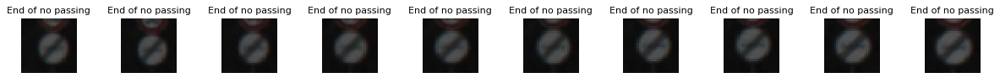

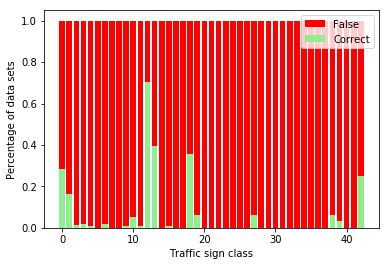

EPOCH    1: Validation Accuracy = 0.094
False predictions: 2929


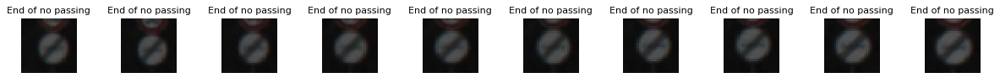

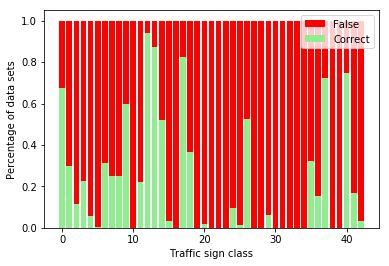

EPOCH    2: Validation Accuracy = 0.336
False predictions: 1935


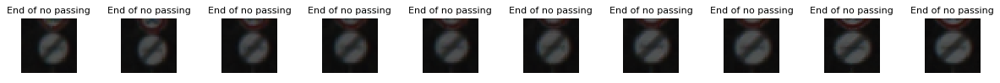

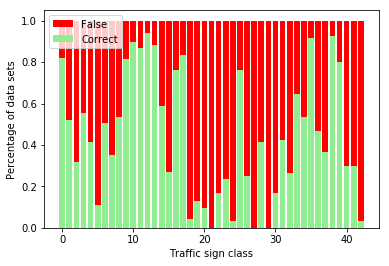

EPOCH    3: Validation Accuracy = 0.561
False predictions: 1181


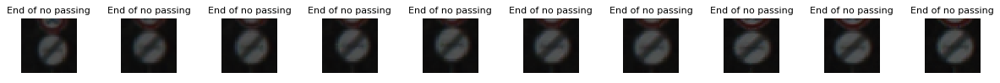

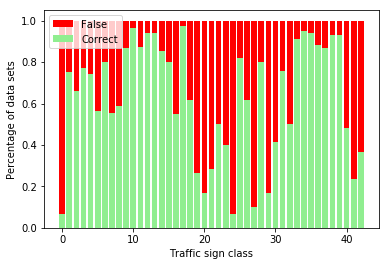

EPOCH    4: Validation Accuracy = 0.732
False predictions: 888


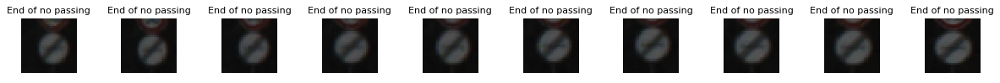

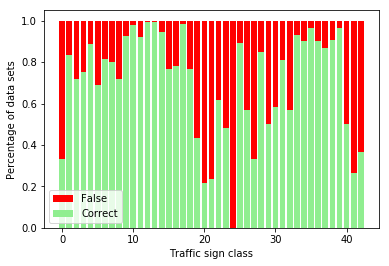

EPOCH    5: Validation Accuracy = 0.799
False predictions: 674


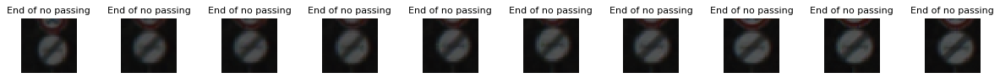

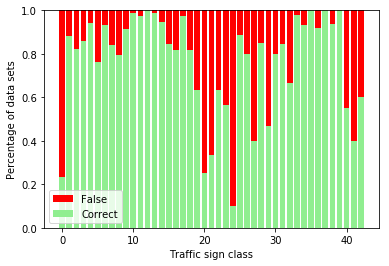

EPOCH    6: Validation Accuracy = 0.847
False predictions: 580


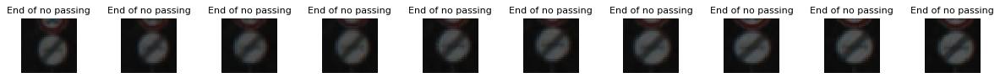

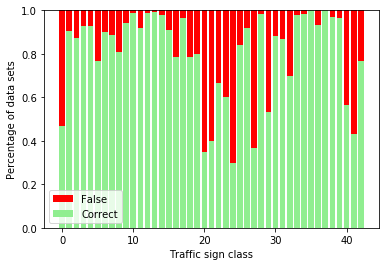

EPOCH    7: Validation Accuracy = 0.868
False predictions: 542


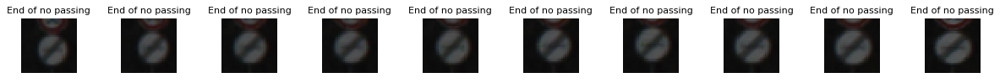

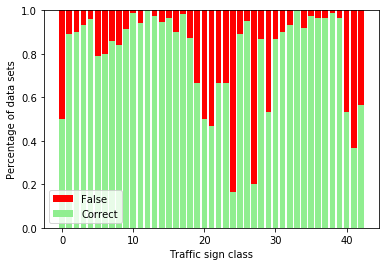

EPOCH    8: Validation Accuracy = 0.877
False predictions: 451


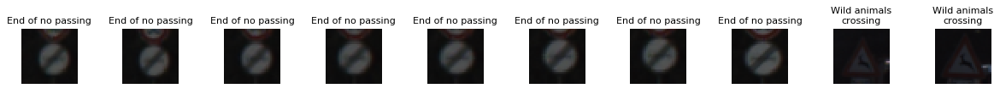

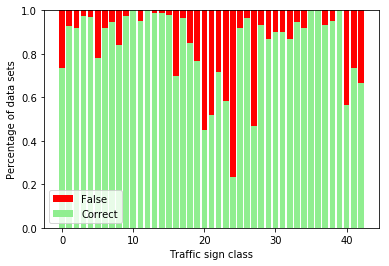

EPOCH    9: Validation Accuracy = 0.898
False predictions: 414


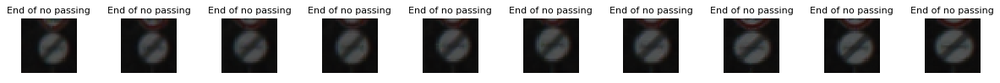

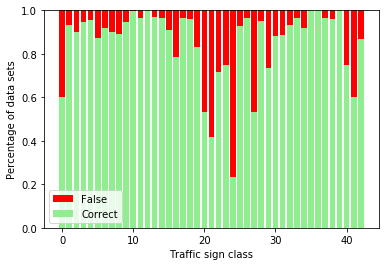

EPOCH   10: Validation Accuracy = 0.906
False predictions: 388


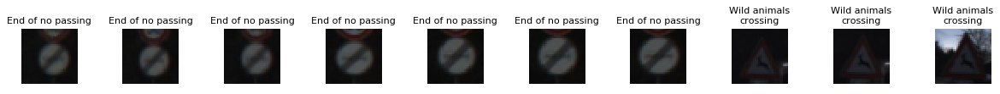

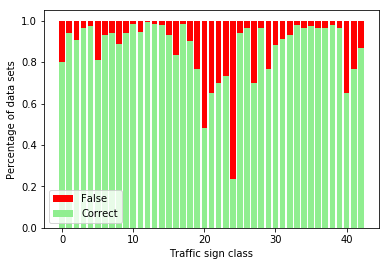

EPOCH   11: Validation Accuracy = 0.912
False predictions: 364


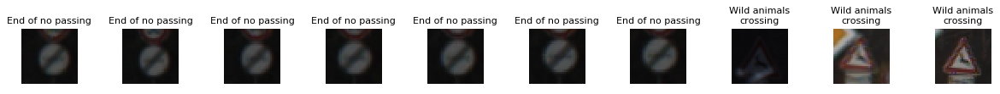

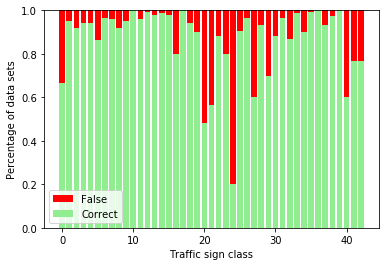

EPOCH   12: Validation Accuracy = 0.917
False predictions: 332


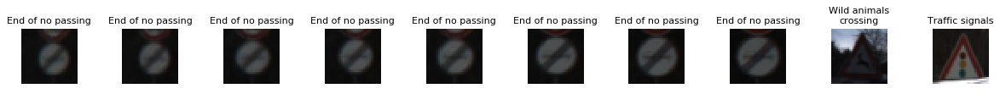

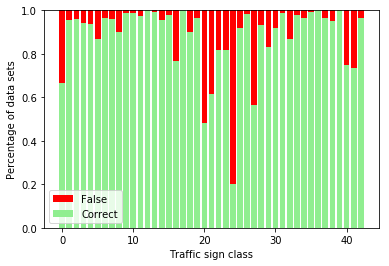

EPOCH   13: Validation Accuracy = 0.925
False predictions: 308


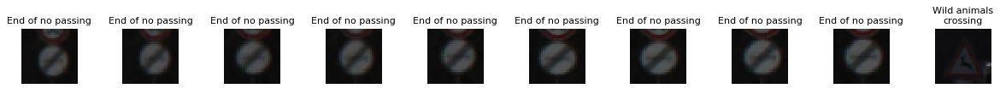

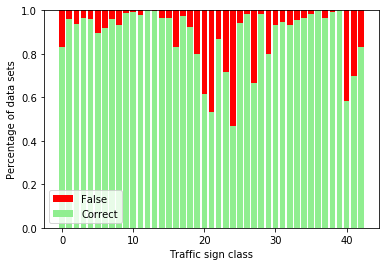

EPOCH   14: Validation Accuracy = 0.930
False predictions: 335


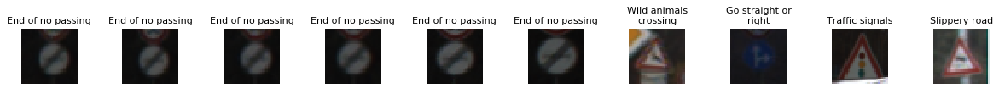

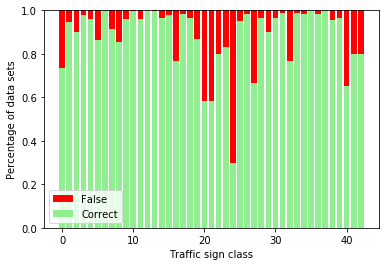

EPOCH   15: Validation Accuracy = 0.924
False predictions: 306


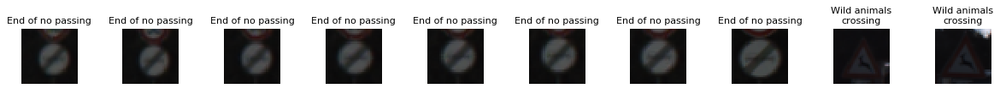

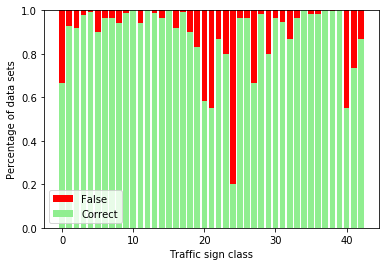

EPOCH   16: Validation Accuracy = 0.931
False predictions: 305


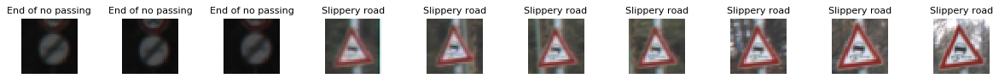

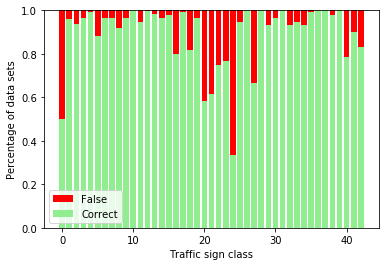

EPOCH   17: Validation Accuracy = 0.931
False predictions: 268


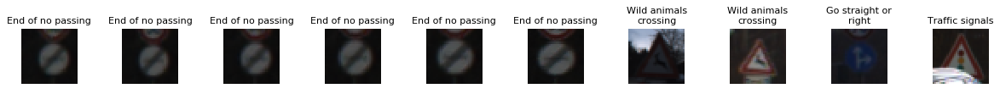

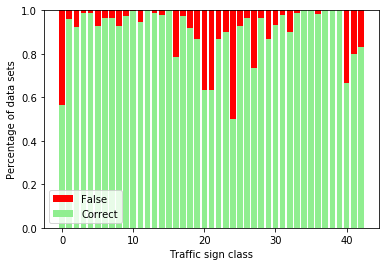

EPOCH   18: Validation Accuracy = 0.939
False predictions: 259


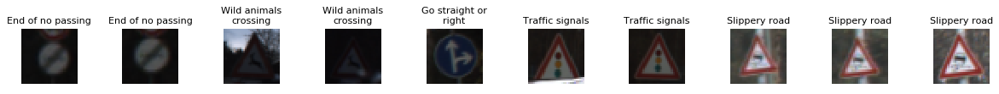

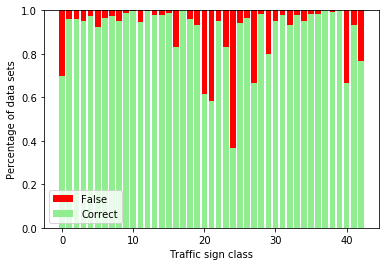

EPOCH   19: Validation Accuracy = 0.941
False predictions: 255


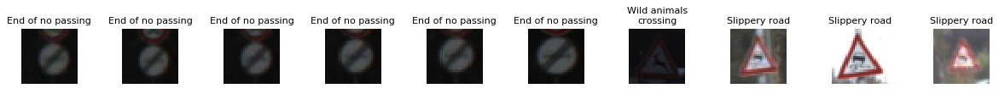

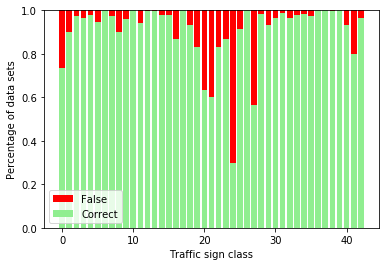

EPOCH   20: Validation Accuracy = 0.942
False predictions: 258


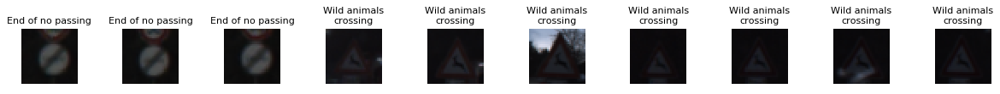

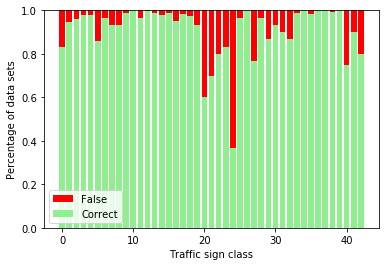

EPOCH   21: Validation Accuracy = 0.941
False predictions: 289


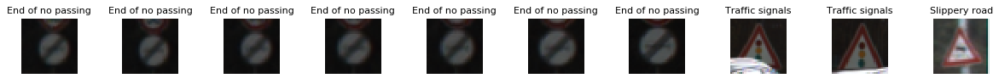

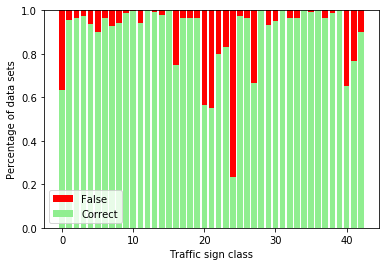

EPOCH   22: Validation Accuracy = 0.934
False predictions: 284


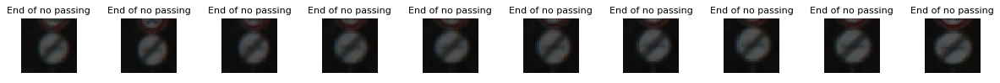

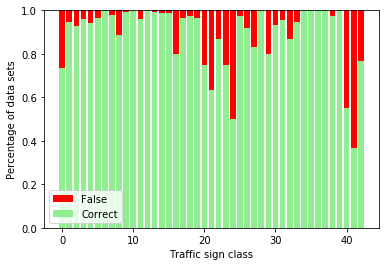

EPOCH   23: Validation Accuracy = 0.936
False predictions: 254


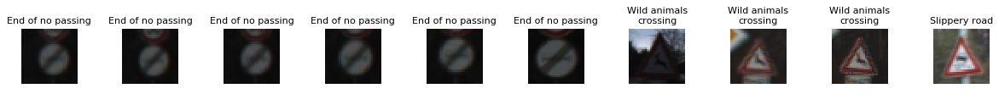

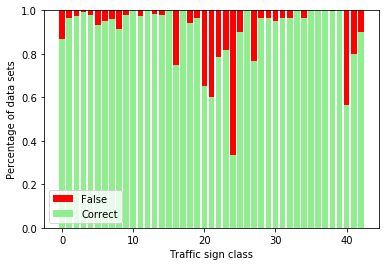

EPOCH   24: Validation Accuracy = 0.942
False predictions: 246


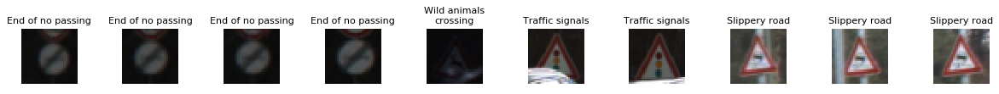

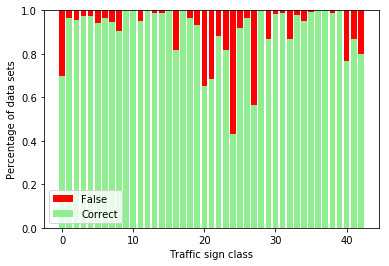

EPOCH   25: Validation Accuracy = 0.944
False predictions: 235


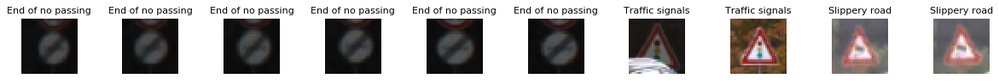

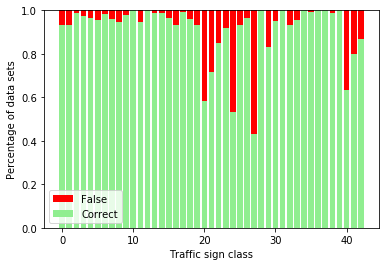

EPOCH   26: Validation Accuracy = 0.947
False predictions: 221


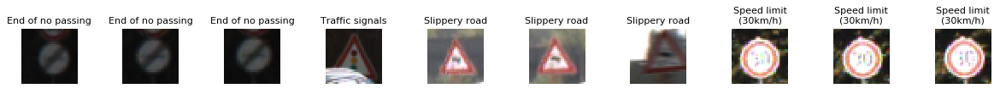

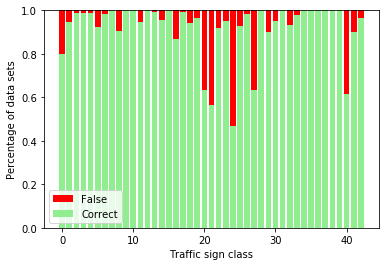

EPOCH   27: Validation Accuracy = 0.950
False predictions: 220


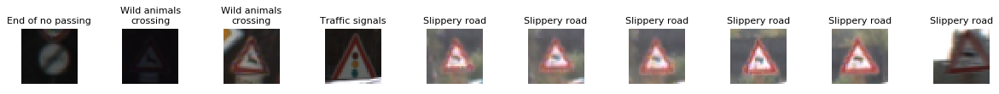

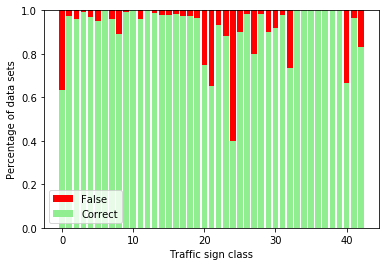

EPOCH   28: Validation Accuracy = 0.950
False predictions: 286


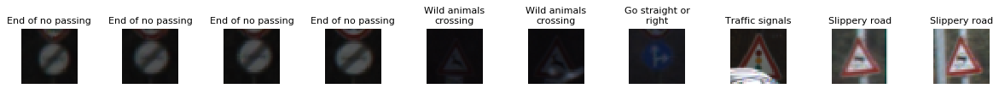

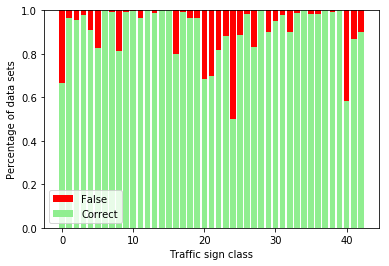

EPOCH   29: Validation Accuracy = 0.935
False predictions: 291


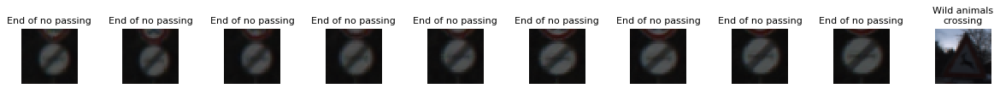

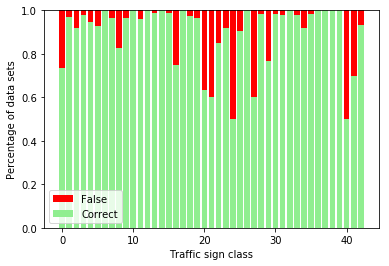

EPOCH   30: Validation Accuracy = 0.934
False predictions: 207


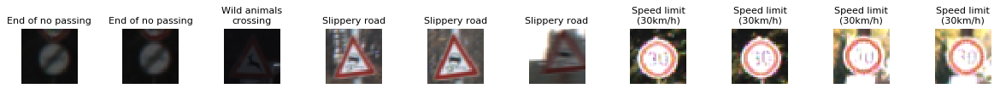

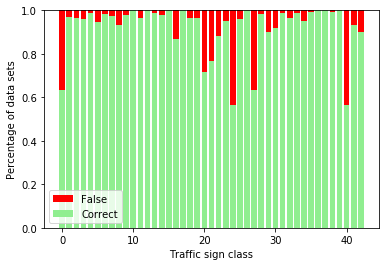

EPOCH   31: Validation Accuracy = 0.953
False predictions: 224


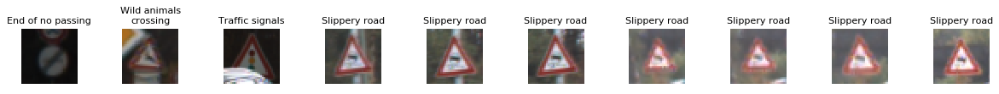

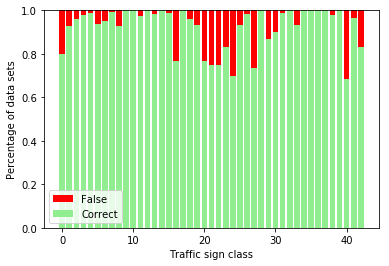

EPOCH   32: Validation Accuracy = 0.949
False predictions: 249


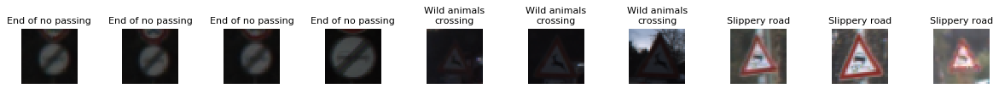

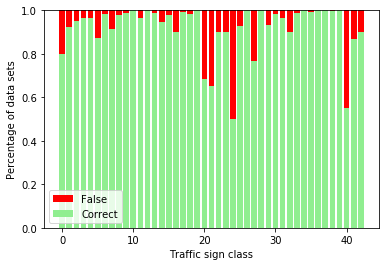

EPOCH   33: Validation Accuracy = 0.944
False predictions: 221


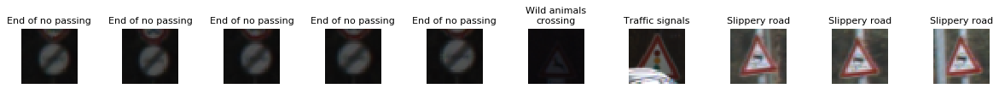

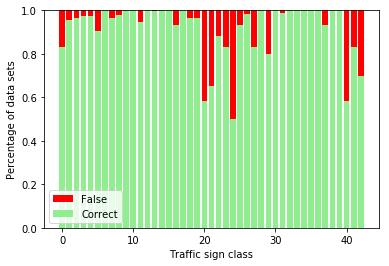

EPOCH   34: Validation Accuracy = 0.950
False predictions: 205


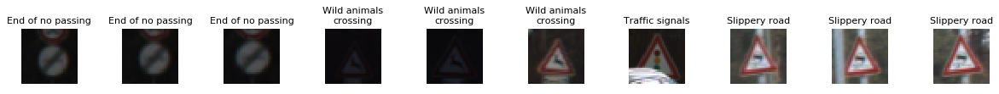

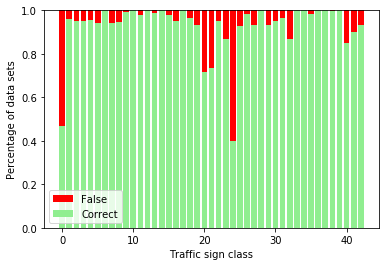

EPOCH   35: Validation Accuracy = 0.954
False predictions: 210


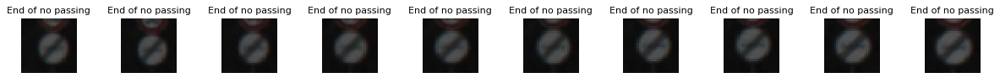

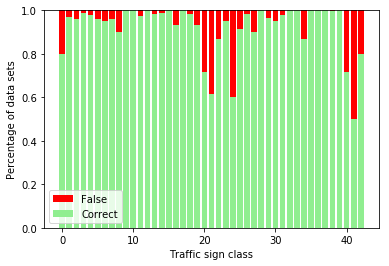

EPOCH   36: Validation Accuracy = 0.952
False predictions: 214


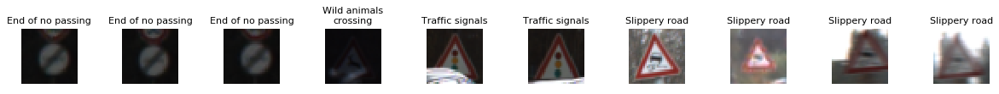

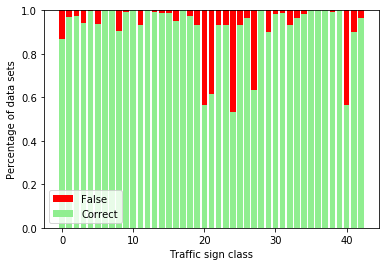

EPOCH   37: Validation Accuracy = 0.951
False predictions: 211


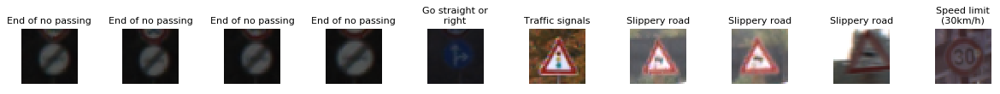

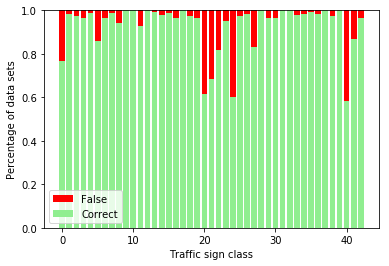

EPOCH   38: Validation Accuracy = 0.952
False predictions: 234


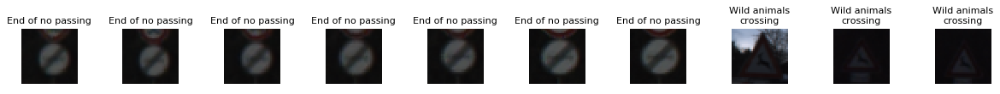

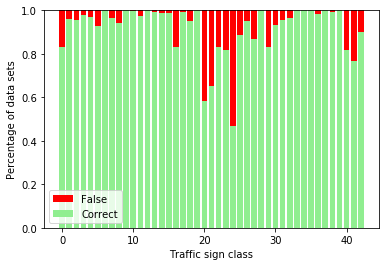

EPOCH   39: Validation Accuracy = 0.947
False predictions: 189


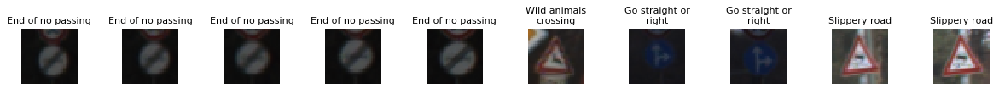

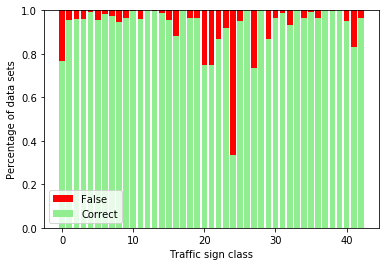

EPOCH   40: Validation Accuracy = 0.957
False predictions: 211


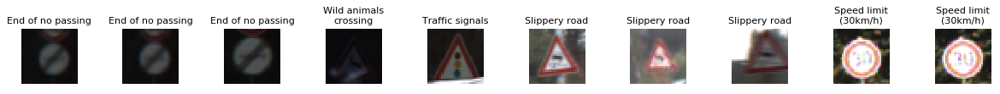

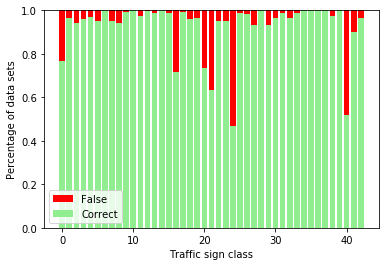

EPOCH   41: Validation Accuracy = 0.952
False predictions: 245


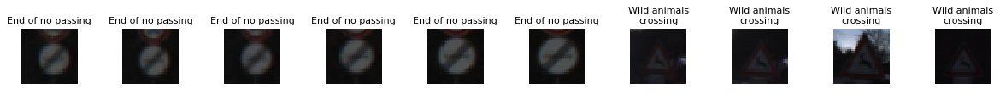

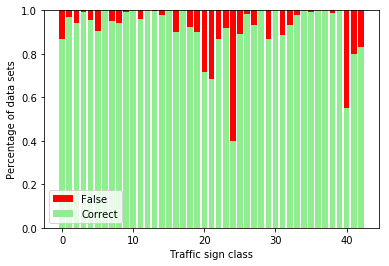

EPOCH   42: Validation Accuracy = 0.944
False predictions: 200


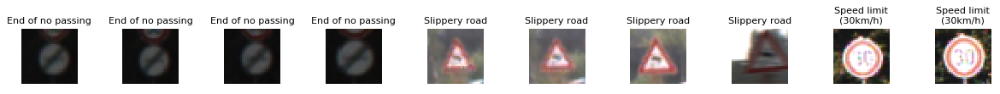

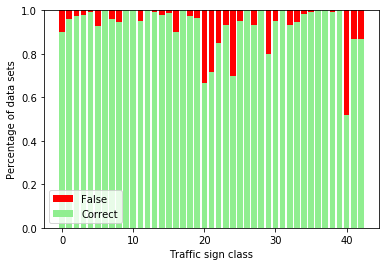

EPOCH   43: Validation Accuracy = 0.955
False predictions: 248


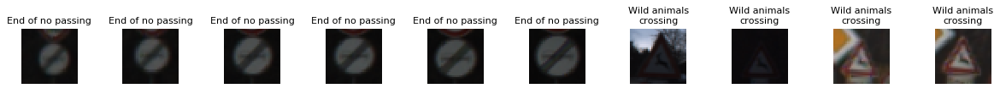

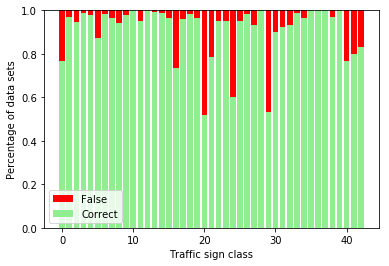

EPOCH   44: Validation Accuracy = 0.944
False predictions: 215


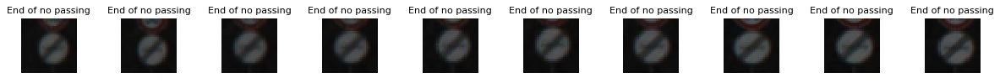

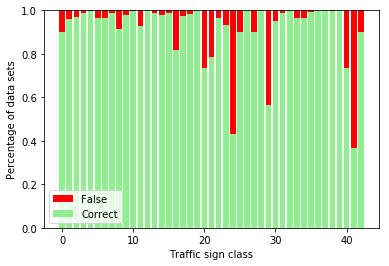

EPOCH   45: Validation Accuracy = 0.951
False predictions: 226


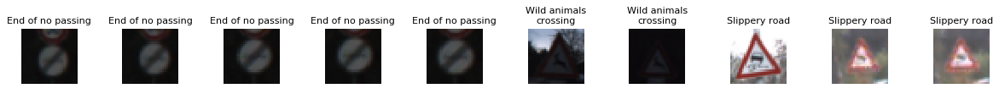

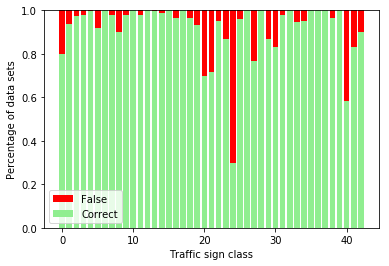

EPOCH   46: Validation Accuracy = 0.949
False predictions: 218


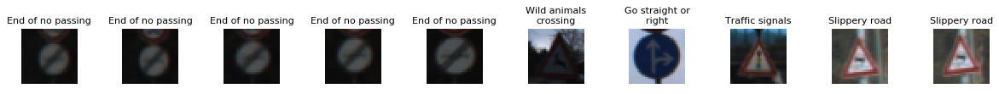

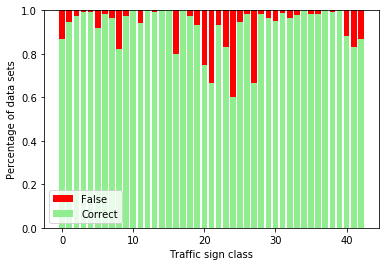

EPOCH   47: Validation Accuracy = 0.951
False predictions: 223


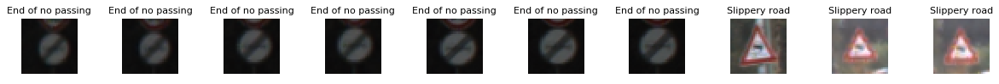

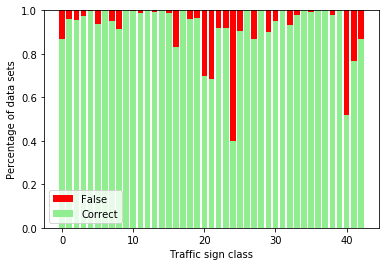

EPOCH   48: Validation Accuracy = 0.949
False predictions: 201


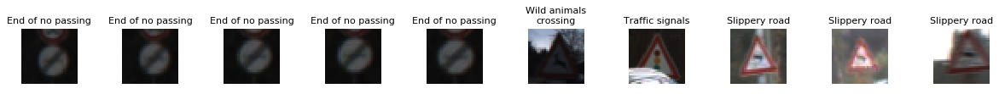

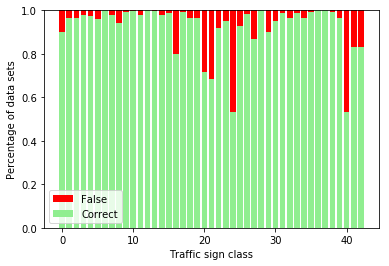

EPOCH   49: Validation Accuracy = 0.954
False predictions: 215


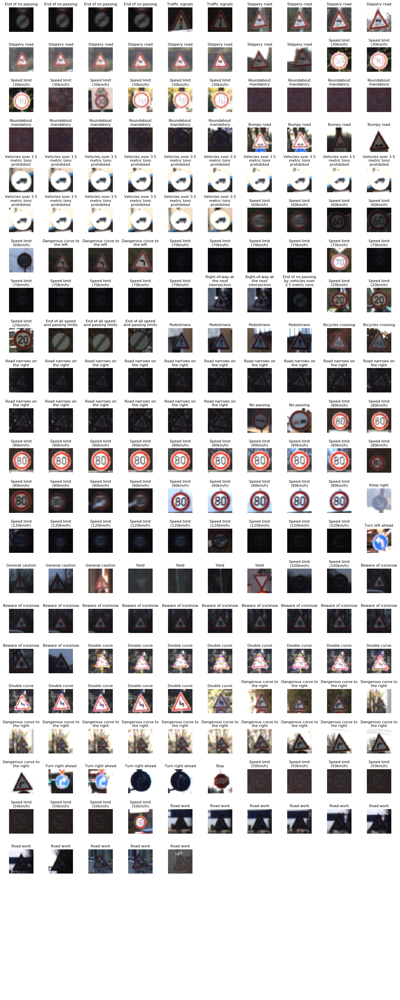

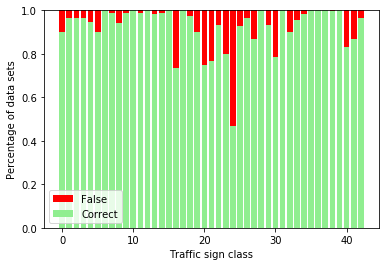

EPOCH   50: Validation Accuracy = 0.951
Model saved


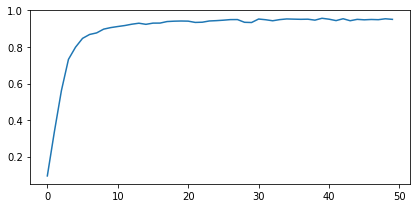

In [68]:
# define constants
lastmaximages = 250
normalmaximages = 10

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    
    # display message
    print("Training...")
    
    # initialize variables
    validation_accuracy_store = []
    
    # iterate over all epochs
    for idx in range(epochs):
        
        blast = ((idx + 1) == epochs)
        
        # shuffle training data in each epoch
        X_train_norm, y_train_conv = shuffle(X_train_norm, y_train_conv)
        
        # iterate over all batches
        for offset in range(0, n_train, batch_size):
            
            # get current batch training set
            end = offset + batch_size
            batch_x, batch_y = X_train_norm[offset:end], y_train_conv[offset:end]
            
            # execute training operation
            sess.run(training_operation, feed_dict = {x: batch_x, y: batch_y, tf_keep_prob: keep_prob})
        
        # validate accuracy current of epoch
        if blast:
            maximages = lastmaximages
        else:
            maximages = normalmaximages
        validation_accuracy, predictions, falsepredictions = evaluate(sess, X_valid_norm, X_valid, y_valid_conv, batch_size, maximages, bdisplaycorrect = False, bdisplayfalse = True)
        validation_accuracy_store.append(validation_accuracy)
        
        # display histogram of predictions
        plot_histogram(np.arange(n_classes), (y_valid[predictions], y_valid[falsepredictions]), colors = ['lightgreen', 'red'], x_label = 'Traffic sign class', legend = ('Correct', 'False'), brelative = True)
        
        # display validation accuracy of current epoch
        print("EPOCH {:4d}:".format(idx + 1), "Validation Accuracy = {:.3f}".format(validation_accuracy))
    
    # save training result
    saver.save(sess, '../../GD_GitHubData/temp_data/tsclass')
    
    # display message
    print("Model saved")
    
    # display 
    plotfigure, plotaxes = plt.subplots(1, 1, figsize = (6, 3))
    plotfigure.tight_layout()
    plt.plot(validation_accuracy_store)
    plt.show()

In [ ]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('../../GD_GitHubData/temp_data'))

    test_accuracy = evaluate(sess, X_test_norm, y_test_conv, batch_size)
    print("Test Accuracy = {:.3f}".format(test_accuracy))

---

## Step 3: Test a Model on New Images

To give yourself more insight into how your model is working, download at least five pictures of German traffic signs from the web and use your model to predict the traffic sign type.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Load and Output the Images

In [ ]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.

# define constants
subfolder = 'own'
imagemask = '*.jpg'
ownlabelnums = [5, 25, 25, 38, 9, 14]
unknownlabel = 'Untrained traffic sign'

def load_images(subfolder, imagemask, checklabelnums, labeldict, unknownlabel):
# ...
# This function loads images to be checked
# ...
# Inputs
# ...
# subfolder      : subfolder with images to be checked
# imagemask      : file name mask for images to be checked
# checklabelnums : dictionary of image labels
# labeldict      : dictionary of image labels
# unknownlabel   : label to be used for unknown labels (label number <= 0)
# ...
# Outputs
# ...
# checkimages : array of images to be checked
# checklabels : labels of images to be checked
    
    # get path to images
    fileimages = glob.glob(os.path.join('.', subfolder, imagemask))
    
    # initialize variables
    checkimages = []
    checklabels = []
        
    # loop through check images
    for idx, fileimage in enumerate(fileimages):
            
        # read check image
        checkimages.append(mpimg.imread(fileimage))
        
        # get image label
        if (checklabelnums[idx] >= 0):
            currentlabel = labeldict[checklabelnums[idx]]
        else:
            currentlabel = unknownlabel
        checklabels.append(currentlabel)
    
    # plot check images with correct labels
    checkimages = np.asarray(checkimages)
    checklabels = np.asarray(checklabels)
    plot_traffic_signs(checkimages, checklabels, len(checkimages))
    
    return checkimages, checklabels

ownimages, ownlabels = load_images(subfolder, imagemask, ownlabelnums, labeldict, unknownlabel)

### Predict the Sign Type for Each Image

In [ ]:
### Run the predictions here and use the model to output the prediction for each image.
### Make sure to pre-process the images with the same pre-processing pipeline used earlier.
### Feel free to use as many code cells as needed.

def predict_image_labels(checkimages, labeldict):
# ...
# This function predicts labels for images
# ...
# Inputs
# ...
# checkimages : images for which labels should be predicted
# labeldict   : dictionary of image labels
# ...
# Outputs
# ...
# checklabelnums_pred : array of predicted label numbers
# checklabels_pred    : predicted labels
# checkimages_norm    : normized images
    
    # define constants
    session_path = '../../GD_GitHubData/temp_data'
    
    # normalize input data
    checkimages_norm = np.asarray(((checkimages / 127.5) - 1), np.float32)
    
    # restore trained network
    with tf.Session() as sess:
        saver.restore(sess, tf.train.latest_checkpoint(session_path))
        
        # predict labels for check images
        predictions = sess.run(logits, feed_dict = {x: checkimages_norm, tf_keep_prob: 1.0})
        checklabelnums_pred = np.argmax(predictions, 1)
        
    # plot check images with predicted labels
    checklabels_pred = [labeldict[checklabelnum_pred] for checklabelnum_pred in checklabelnums_pred]
    plot_traffic_signs(checkimages, checklabels_pred, len(checkimages))
    
    return checklabelnums_pred, checklabels_pred, checkimages_norm

ownlabelnums_pred, ownlabels_pred, ownimages_norm = predict_image_labels(ownimages, labeldict)

### Analyze Performance

In [ ]:
### Calculate the accuracy for these 5 new images. 
### For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate on these new images.

def check_accuracy(checklabelnums, checklabelnums_pred):
# ...
# This function checks the accuracy of predicted labels
# ...
# Inputs
# ...
# checklabelnums      : actual label numbers
# checklabelnums_pred : predicted label numbers
# ...
# Outputs
# ...
# checklabelnums_pred : array of predicted label numbers
# checklabels_pred    : predicted labels
    
    # calculate percentage of accurately predicted labels of own images
    correct_predictions = np.sum(checklabelnums == checklabelnums_pred)
    number_images = len(checklabelnums)
    accuracy = (correct_predictions / number_images * 100)
    
    # display result
    print(correct_predictions, 'out of', number_images, 'own images predicted correctly - accuracy is', '{:5.1f}'.format(accuracy), '%')
    
    return accuracy

accuracy = check_accuracy(ownlabelnums, ownlabelnums_pred)

### Output Top 5 Softmax Probabilities For Each Image Found on the Web

For each of the new images, print out the model's softmax probabilities to show the **certainty** of the model's predictions (limit the output to the top 5 probabilities for each image). [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. 

The example below demonstrates how tf.nn.top_k can be used to find the top k predictions for each image.

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example. The values in the array represent predictions. The array contains softmax probabilities for five candidate images with six possible classes. `tf.nn.top_k` is used to choose the three classes with the highest probability:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

In [ ]:
### Print out the top five softmax probabilities for the predictions on the German traffic sign images found on the web. 
### Feel free to use as many code cells as needed.

def evaluate_top_k(logits, checkimages, checkimages_norm, checklabels, averageimages, labels):
# ...
# This function evaluates the top k predicted images for each image to be checked
# ...
# Inputs
# ...
# logits           : tensorflow forward propagation pipeline
# checkimages      : images to be checked
# checkimages_norm : normalized images to be checked
# checklabels      : actual label of images to be checked
# averageimages    : reference images for each label
# labels           : labels of reference images
# ...
# Outputs
# ...
# checklabelnums_pred : array of predicted label numbers
# checklabels_pred    : predicted labels
    
    # define constants
    session_path = '../../GD_GitHubData/temp_data'
    k_size = 5
    horizontalplotsize = 3
    verticalplotsize = 2
    dpi = 80
    
    # define pipeline
    softmax_logits = tf.nn.softmax(logits)
    top_k = tf.nn.top_k(softmax_logits, k = k_size)
    
    # restore trained network
    with tf.Session() as sess:
        saver.restore(sess, tf.train.latest_checkpoint(session_path))
        
        # determine top k softmax labels for check images
        top_k_pred = sess.run(top_k, feed_dict = {x: checkimages_norm, tf_keep_prob: 1.0})
        
    # get all predicted labels and percentages
    top_k = top_k_pred[1]
    top_k_percentages = top_k_pred[0]
    
    # loop through check images
    for idx1, checkimage in enumerate(checkimages):
    
        # initialize variables
        topkimages = []
        topklabels = []
        
        # add check image to result
        topkimages.append(checkimage)
        topklabels.append(('Original: ' + checklabels[idx1]))
        
        # loop through top k prediction for current image
        for idx2, k in enumerate(top_k[idx1]):
            
            # add top k image to result
            topkimages.append(averageimages[k])
            topklabels.append(('Top ' + str(idx2 + 1) + ': ' + labels[k]))
        
        # plot check image with top k predictions
        topkimages = np.asarray(topkimages)
        topklabels = np.asarray(topklabels)
        plot_traffic_signs(topkimages, topklabels, (k_size + 1))
        
        # plot prediction percentage for top k predictions
        plotfigure, plotaxes = plt.subplots(1, 1, figsize = (horizontalplotsize, verticalplotsize), dpi = dpi)
        plotfigure.tight_layout()
        plotaxes.yaxis.tick_right()
        plotaxes.barh(np.flip(topklabels[1:]), np.flip(top_k_percentages[idx1]), color='blue', ecolor='black')

evaluate_top_k(logits, ownimages, ownimages_norm, ownlabels, averageimages, labels)

### Project Writeup

Once you have completed the code implementation, document your results in a project writeup using this [template](https://github.com/udacity/CarND-Traffic-Sign-Classifier-Project/blob/master/writeup_template.md) as a guide. The writeup can be in a markdown or pdf file. 

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

---

## Step 4 (Optional): Visualize the Neural Network's State with Test Images

 This Section is not required to complete but acts as an additional excersise for understaning the output of a neural network's weights. While neural networks can be a great learning device they are often referred to as a black box. We can understand what the weights of a neural network look like better by plotting their feature maps. After successfully training your neural network you can see what it's feature maps look like by plotting the output of the network's weight layers in response to a test stimuli image. From these plotted feature maps, it's possible to see what characteristics of an image the network finds interesting. For a sign, maybe the inner network feature maps react with high activation to the sign's boundary outline or to the contrast in the sign's painted symbol.

 Provided for you below is the function code that allows you to get the visualization output of any tensorflow weight layer you want. The inputs to the function should be a stimuli image, one used during training or a new one you provided, and then the tensorflow variable name that represents the layer's state during the training process, for instance if you wanted to see what the [LeNet lab's](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) feature maps looked like for it's second convolutional layer you could enter conv2 as the tf_activation variable.

For an example of what feature map outputs look like, check out NVIDIA's results in their paper [End-to-End Deep Learning for Self-Driving Cars](https://devblogs.nvidia.com/parallelforall/deep-learning-self-driving-cars/) in the section Visualization of internal CNN State. NVIDIA was able to show that their network's inner weights had high activations to road boundary lines by comparing feature maps from an image with a clear path to one without. Try experimenting with a similar test to show that your trained network's weights are looking for interesting features, whether it's looking at differences in feature maps from images with or without a sign, or even what feature maps look like in a trained network vs a completely untrained one on the same sign image.

<figure>
 <img src="visualize_cnn.png" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your output should look something like this (above)</p> 
 </figcaption>
</figure>
 <p></p> 


In [ ]:
### Visualize your network's feature maps here.
### Feel free to use as many code cells as needed.

# image_input: the test image being fed into the network to produce the feature maps
# tf_activation: should be a tf variable name used during your training procedure that represents the calculated state of a specific weight layer
# activation_min/max: can be used to view the activation contrast in more detail, by default matplot sets min and max to the actual min and max values of the output
# plt_num: used to plot out multiple different weight feature map sets on the same block, just extend the plt number for each new feature map entry

def outputFeatureMap(session, image_input, tf_activation):
    # Here make sure to preprocess your image_input in a way your network expects
    # with size, normalization, ect if needed
    # image_input =
    # Note: x should be the same name as your network's tensorflow data placeholder variable
    # If you get an error tf_activation is not defined it may be having trouble accessing the variable from inside a function
    
    # define constants
    featuretext = 'Feature map '
    channeltext = ' channel '
    #interpolation = 'nearest'
    interpolation = 'bilinear'
    maximages = 250
    
    # retrieve weight matrix
    activation = session.run(tf_activation, feed_dict = {x : [image_input]})
    
    # gather information about dimensions
    featuremaps = activation.shape[3]
    colormaps = activation.shape[2]
    
    # initialize variables
    featureimages = []
    featurelabels = []
    
    # plot all feature maps
    for featuremap in range(featuremaps):
        
        # layer has color input
        if (colormaps == 3):
            
            # do not define color map
            cmap = None
            
            # save current feature map as color image
            featureimages.append(activation[:, :, :, featuremap])
            featurelabels.append((featuretext + str(featuremap)))
        
        # layer has no color input
        else:
            
            # select grayscale color map
            cmap = 'gray'
            
            # save all channels
            for channel in range(colormaps):
                
                # save feature map as image
                featureimages.append(activation[:, :, channel, featuremap])
                featurelabels.append((featuretext + str(featuremap) + channeltext + str(channel)))
    
    # convert feature images and labels to arrays
    featureimages = np.asarray(featureimages)
    featurelabels = np.asarray(featurelabels)
    
    # normalize feature images
    featureimages = np.asarray((255 * ((featureimages - np.min(featureimages)) / (np.max(featureimages) - np.min(featureimages)))), dtype = np.int32)
    
    # display feature images
    plot_traffic_signs(featureimages, featurelabels, min(len(featurelabels), maximages), interpolation = interpolation, cmap = cmap)

In [ ]:
# define constants
probe_num = 14

# define image to probe convolutional layers
probe_image = averageimages[probe_num]
probe_image_norm = np.asarray(((probe_image / 127.5) - 1), np.float32)
#probe_image_norm = 0 * np.ones_like(probe_image_norm)
print('Image used to probe convolutional layers')
plot_traffic_signs(np.asarray([probe_image]), np.asarray([labels[probe_num]]), 1)

# retrieve activation variables
conv1_W, conv2_W, conv3_W = conv_Ws

# restore trained network
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('../../GD_GitHubData/temp_data'))
    
    # display first layer
    print('First convolutional layer')
    outputFeatureMap(sess, probe_image, conv1_W)
    
    # display second layer
    print('Second convolutional layer')
    outputFeatureMap(sess, probe_image, conv2_W)

    # display second layer
    print('Third convolutional layer')
    outputFeatureMap(sess, probe_image, conv3_W)

## Fun with unknown traffic signs

Predicting images that should be predicted is one thing. It's more fun to try to predict images that shouldn't be predicted - let's say US traffic signs ;-)

In [ ]:
# define constants
subfolder = 'wrong'
imagemask = '*.jpg'
wronglabel = 'Untrained traffic sign'
wronglabelnums = [-1, -1, -1, -1, -1, -1]

wrongimages, wronglabels = load_images(subfolder, imagemask, wronglabelnums, labeldict, wronglabel)
wronglabelnums_pred, wronglabels_pred, wrongimages_norm = predict_image_labels(wrongimages, labeldict)
accuracy = check_accuracy(wronglabelnums, wronglabelnums_pred)
evaluate_top_k(logits, wrongimages, wrongimages_norm, wronglabels, averageimages, labels)

## Searching within larger pictures

As you normally cannot expect to know where in a picture traffic signs occur, we need an algorithm that searches for traffic signs within a larger picture.

Processing the following image...


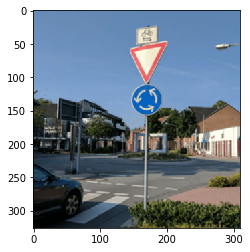

INFO:tensorflow:Restoring parameters from ../../GD_GitHubData/temp_data\tsclass
Image with most probable sign locations:


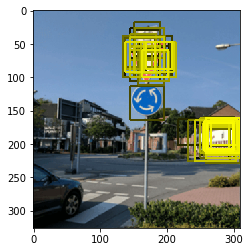

Image with most probable sign locations (single sign labels):


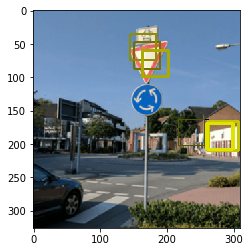

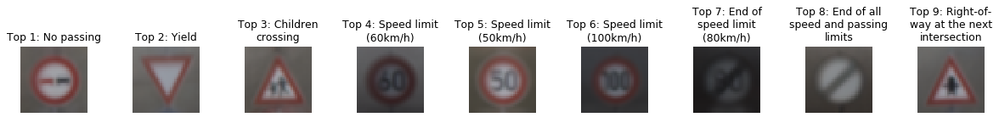

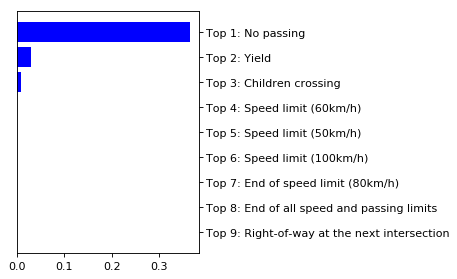

Processing the following image...


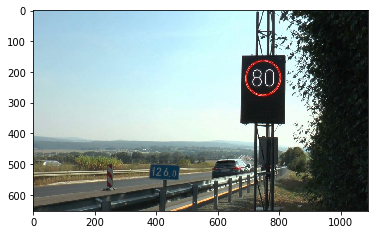

INFO:tensorflow:Restoring parameters from ../../GD_GitHubData/temp_data\tsclass
Image with most probable sign locations:


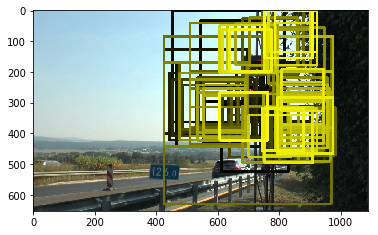

Image with most probable sign locations (single sign labels):


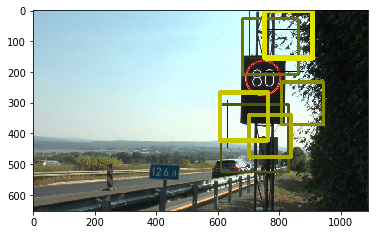

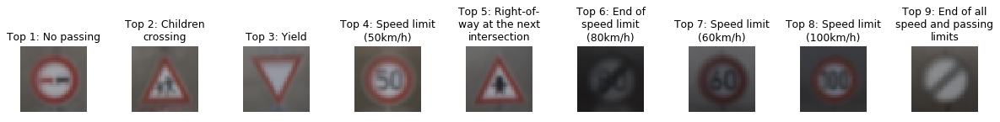

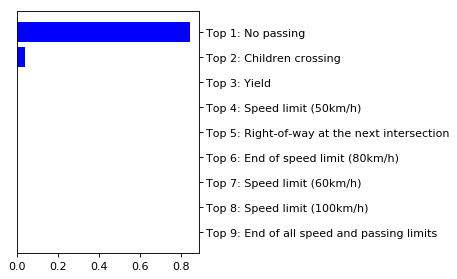

Processing the following image...


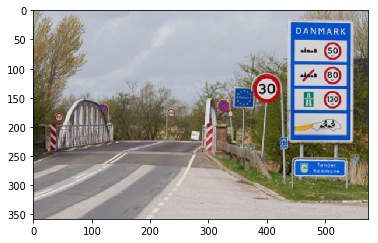

INFO:tensorflow:Restoring parameters from ../../GD_GitHubData/temp_data\tsclass
Image with most probable sign locations:


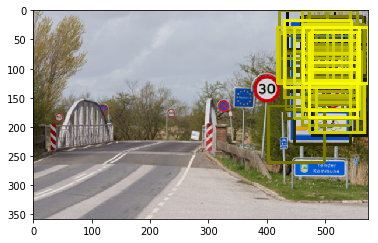

Image with most probable sign locations (single sign labels):


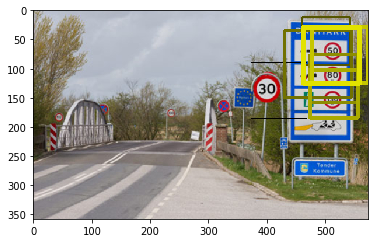

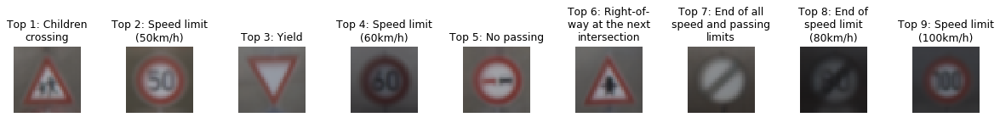

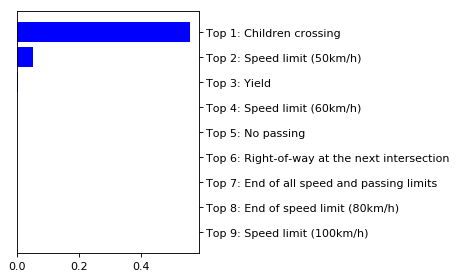

Processing the following image...


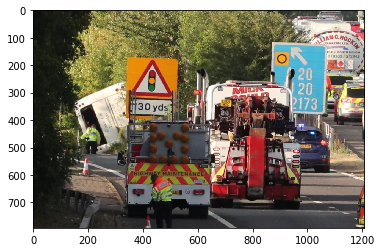

INFO:tensorflow:Restoring parameters from ../../GD_GitHubData/temp_data\tsclass
Image with most probable sign locations:


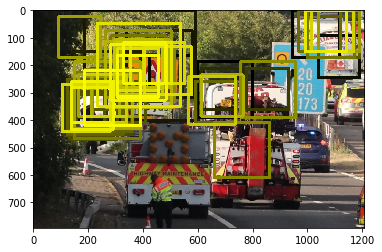

Image with most probable sign locations (single sign labels):


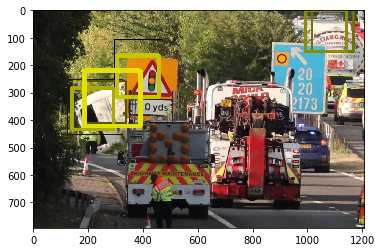

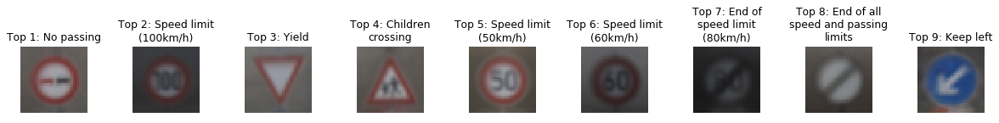

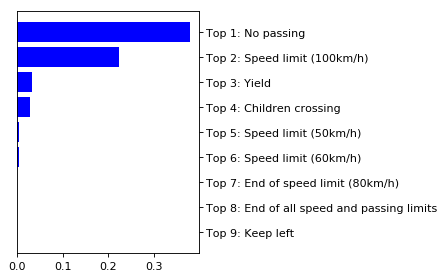

Processing the following image...


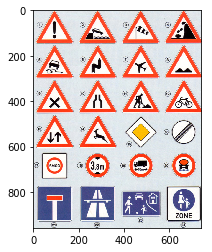

INFO:tensorflow:Restoring parameters from ../../GD_GitHubData/temp_data\tsclass
Image with most probable sign locations:


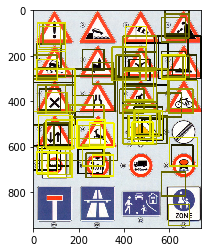

Image with most probable sign locations (single sign labels):


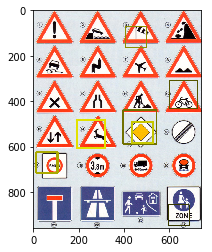

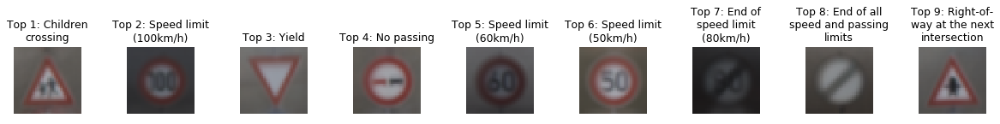

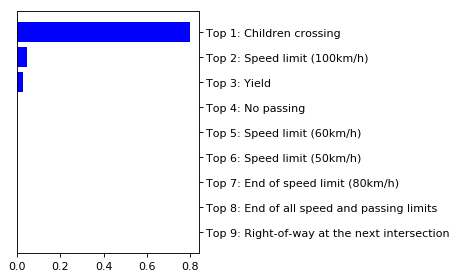

Processing the following image...


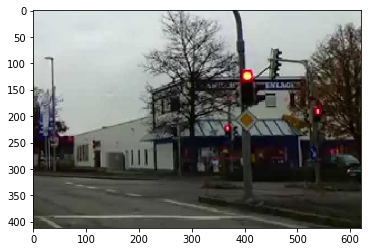

INFO:tensorflow:Restoring parameters from ../../GD_GitHubData/temp_data\tsclass
Image with most probable sign locations:


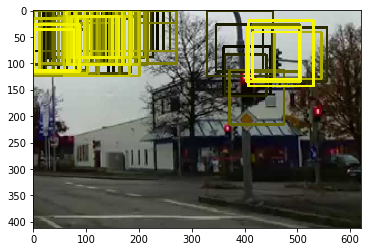

Image with most probable sign locations (single sign labels):


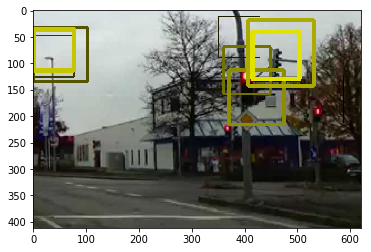

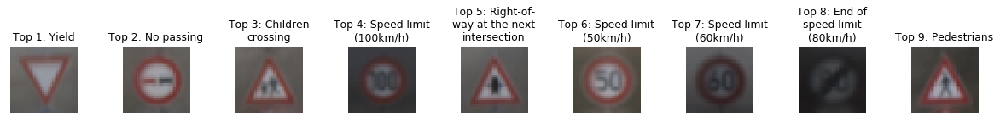

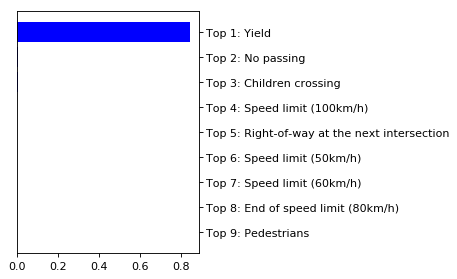

Processing the following image...


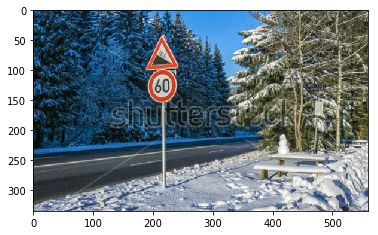

INFO:tensorflow:Restoring parameters from ../../GD_GitHubData/temp_data\tsclass
Image with most probable sign locations:


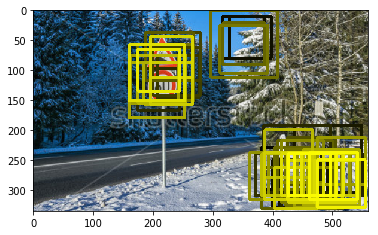

Image with most probable sign locations (single sign labels):


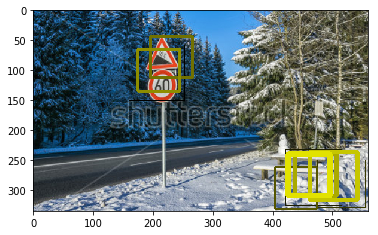

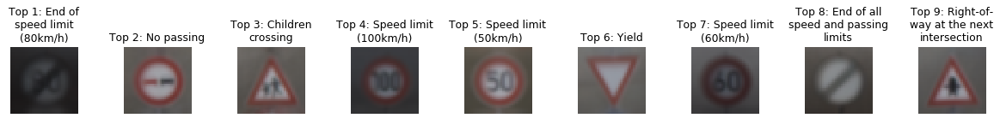

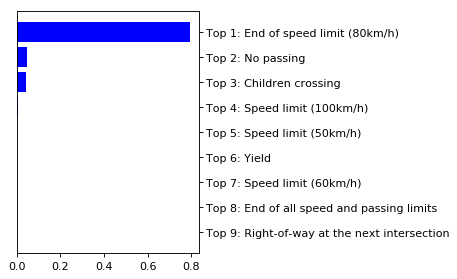

Processing the following image...


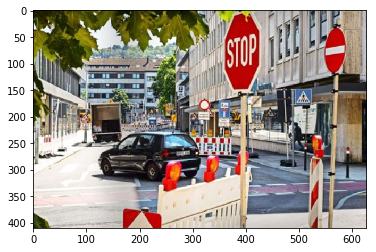

INFO:tensorflow:Restoring parameters from ../../GD_GitHubData/temp_data\tsclass
Image with most probable sign locations:


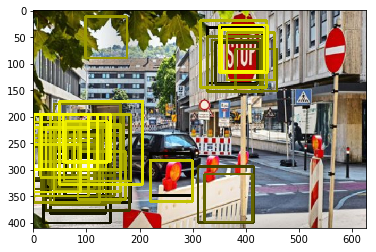

Image with most probable sign locations (single sign labels):


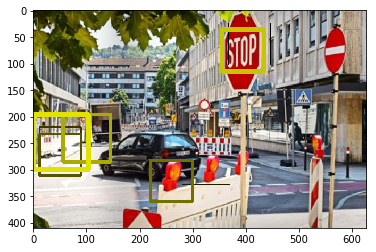

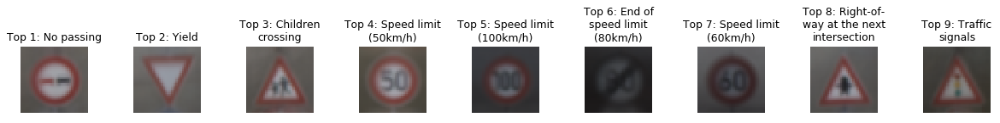

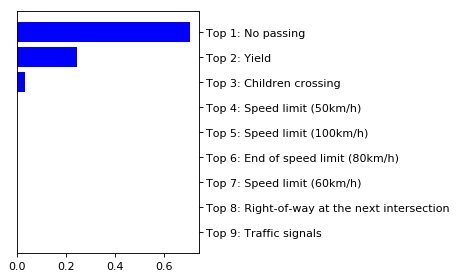

Processing the following image...


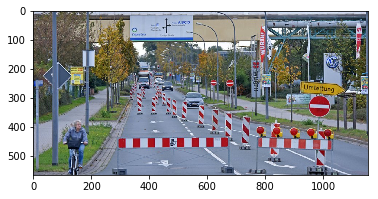

INFO:tensorflow:Restoring parameters from ../../GD_GitHubData/temp_data\tsclass
Image with most probable sign locations:


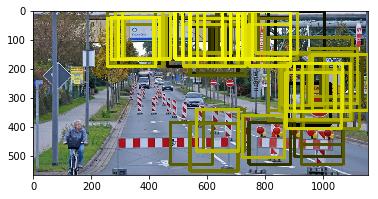

Image with most probable sign locations (single sign labels):


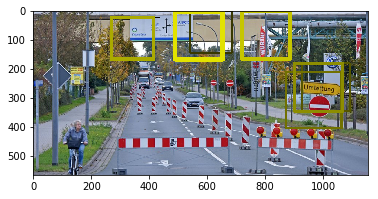

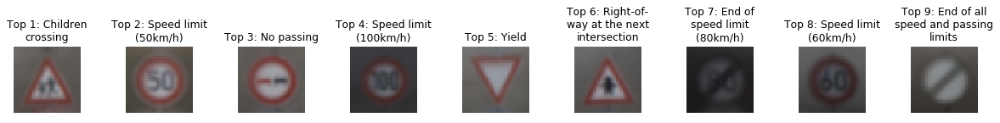

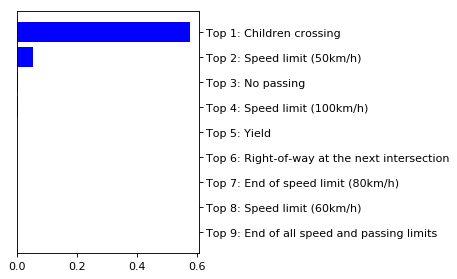

Processing the following image...


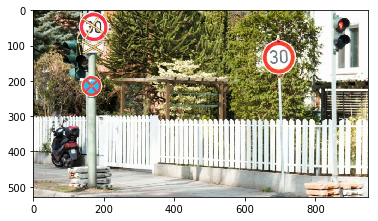

INFO:tensorflow:Restoring parameters from ../../GD_GitHubData/temp_data\tsclass
Image with most probable sign locations:


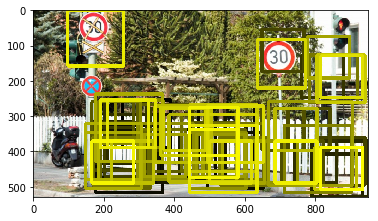

Image with most probable sign locations (single sign labels):


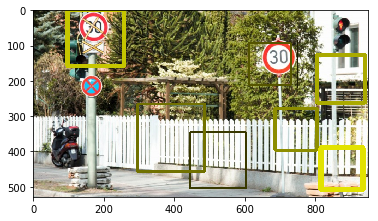

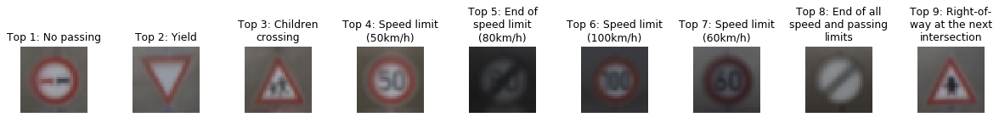

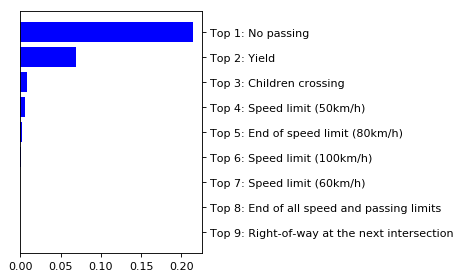

Processing the following image...


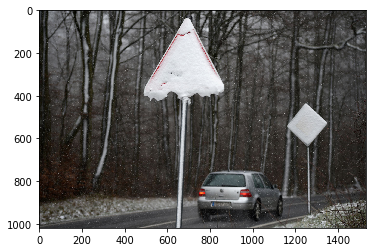

INFO:tensorflow:Restoring parameters from ../../GD_GitHubData/temp_data\tsclass
Image with most probable sign locations:


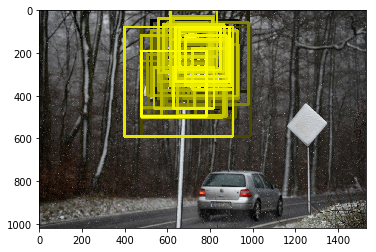

Image with most probable sign locations (single sign labels):


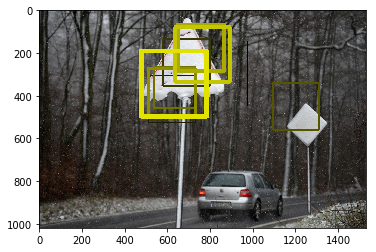

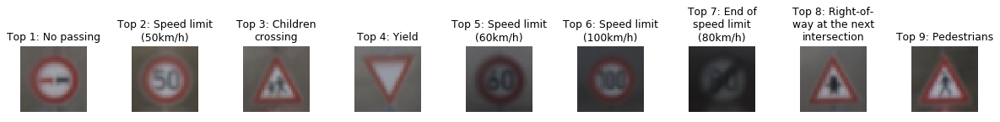

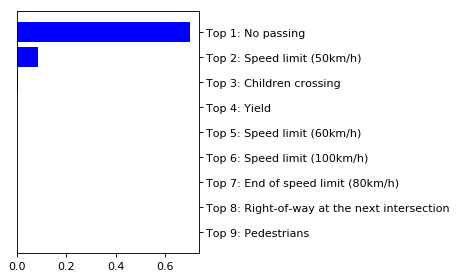

In [12]:
# define constants
largesubfolder = 'large'
largeimagemask = '*.jpg'

def check_large_images(subfolder, imagemask, referenceimages, labels, bdisplay = False, bdisplaydeep = False):
# ...
# This function checks a large image for traffic signs
# ...
# Inputs
# ...
# subfolder       : subfolder with large images to be checked
# imagemask       : file name mask for large images to be checked
# referenceimages : reference images for labels
# labels          : traffic sign labels
# bdisplay        : boolean for 'display information'
# bdisplaydeep    : boolean for 'display deep information'
    
    # define constants
    session_path = '../../GD_GitHubData/temp_data'
    k_size = 9
    base_scale = 32
    max_scale = (320 / 10 * 8)
    stride = 5
    smalllinewidth = (1 / 4)
    linewidth = (1 / 2)
    horizontalplotsize = 3
    verticalplotsize = ((2 / 5) * k_size)
    dpi = 80
    
    # define scales on which to check large images
    scales = np.int32(base_scale * (np.flip(np.arange(np.floor(max_scale / base_scale)) + 1)))
    
    # display information
    if bdisplay:
        print('Scales', scales, '\n')
    
    # get path to images
    fileimages = glob.glob(os.path.join('.', subfolder, imagemask))
    
    # initialize variables
    largeimages = []
        
    # loop through large image file names
    for idx, fileimage in enumerate(fileimages):
            
        # read large image
        largeimage = im.open(fileimage)
        largeimages.append(largeimage)
    
    # loop through large images
    for largeimage in largeimages:
        
        # plot current image
        print('Processing the following image...')
        plt.imshow(largeimage)
        plt.show()
        
        # initialize array for all large images
        image_sections = []
        image_section_locations = []
        
        # check large image on each scale
        for scale in scales:
            
            # scale image
            image_shape = largeimage.size
            scale_factor = (scale / image_shape[0])
            new_height = np.int32(scale_factor * image_shape[1])
            scaledimage = np.array(largeimage.resize((scale, new_height), im.ANTIALIAS))
            
            # get number of steps in scaled image
            xoffsets = np.int32(np.ceil((scale - base_scale + 1) / stride))
            yoffsets = np.int32(np.ceil((new_height - base_scale + 1) / stride))
            
            # all steps valid
            if ((xoffsets > 0) & (yoffsets > 0)):
                
                # display information
                if bdisplay:
                    #print(scale, image_shape, scale_factor, xoffsets, yoffsets)
                    print('Scale', scale, ': Xoffsets', xoffsets, 'Yoffsets', yoffsets)
                    plt.imshow(scaledimage)
                    plt.show()
                
                # iterate through all steps
                for yoffset in range(yoffsets):
                    for xoffset in range(xoffsets):
                        
                        # get image section
                        xstart = (xoffset * stride)
                        xend = (xoffset * stride) + base_scale
                        ystart = (yoffset * stride)
                        yend = (yoffset * stride) + base_scale
                        image_section = scaledimage[ystart:yend, xstart:xend]
                        image_sections.append(image_section)
                        image_section_locations.append(np.int32(np.float64([xstart, xend, ystart, yend]) / scale_factor))
                        
                        # display information
                        if (bdisplay & bdisplaydeep):
                            #print(np.int32(np.float64([xstart, xend, ystart, yend]) / scale_factor))
                            print('Xstart', xstart, 'Ystart', ystart)
                            plt.imshow(image_section)
                            plt.show()
        
        # normalize input data
        image_sections = np.asarray(image_sections)
        image_section_locations = np.asarray(image_section_locations)
        image_sections_norm = np.asarray(((image_sections / 127.5) - 1), np.float32)
        
        # define pipeline (must be called each time before running session below, i.e. cannot be outside of for loop)
        top_k = tf.nn.top_k(logits, k = k_size)
    
        # determine top k softmax labels for check images
        with tf.Session() as sess:
            saver.restore(sess, tf.train.latest_checkpoint(session_path))
            top_k_pred = sess.run(top_k, feed_dict = {x: image_sections_norm, tf_keep_prob: 1.0})
            sess.close()
                        
        # get all predicted labels and percentages
        all_top_ks = top_k_pred[1]
        top_ks = all_top_ks.reshape(-1)
        e_x = np.exp(top_k_pred[0] - np.max(top_k_pred[0]))
        all_top_k_percentages = e_x / e_x.sum()
        top_k_percentages = all_top_k_percentages.reshape(-1)
        
        # ensure to have matching locations
        matching_image_section_locations = []
        for image_section_location in image_section_locations:
            for idx in range(k_size):
                matching_image_section_locations.append(image_section_location)
        matching_image_section_locations = np.asarray(matching_image_section_locations)
        
        # sort by percentage
        args_top_k_percentages = np.flip(np.argsort(top_k_percentages))
        top_ks_sorted = top_ks[args_top_k_percentages]
        top_k_percentages_sorted = top_k_percentages[args_top_k_percentages]
        matching_image_section_locations_sorted = matching_image_section_locations[args_top_k_percentages]
        
        # display image with identified traffic sign locations
        print('Image with most probable sign locations:')
        largeimagesigns = np.copy(largeimage)
        matching_image_section_locations_sorted_reverse = np.flip(matching_image_section_locations_sorted[:(k_size*k_size)])
        section_dims = matching_image_section_locations_sorted_reverse.shape
        for idx, section in enumerate(matching_image_section_locations_sorted_reverse):
            xstart, xend, ystart, yend = section
            points = np.array([[ystart, xstart], [ystart, xend], [yend, xend], [yend, xstart]])
            colorvalue = int(255 * (idx / section_dims[0]))
            varylinewidth = np.int(smalllinewidth / scale_factor)
            cv2.polylines(largeimagesigns, [points], True, (colorvalue, colorvalue, 0), thickness = varylinewidth)
        plt.imshow(largeimagesigns)
        plt.show()        
        
        # remove double entries
        top_label_nums = []
        top_label_percentages = []
        top_sections = []
        for idx, top_k in enumerate(top_ks_sorted):
            if not top_k in top_label_nums:
                top_label_nums.append(top_k)
                top_label_percentages.append(top_k_percentages_sorted[idx])
                top_sections.append(matching_image_section_locations_sorted[idx])
        
        # display image with identified traffic sign locations
        print('Image with most probable sign locations (single sign labels):')
        largeimagesigns = np.copy(largeimage)
        top_sections_reverse = np.flip(top_sections[:k_size])
        section_dims = top_sections_reverse.shape
        for idx, section in enumerate(top_sections_reverse):
            xstart, xend, ystart, yend = section
            points = np.array([[ystart, xstart], [ystart, xend], [yend, xend], [yend, xstart]])
            colorvalue = int(255 * (idx / section_dims[0]))
            varylinewidth = np.int((linewidth / scale_factor) * (colorvalue / 255))
            cv2.polylines(largeimagesigns, [points], True, (colorvalue, colorvalue, 0), thickness = varylinewidth)
        plt.imshow(largeimagesigns)
        plt.show()        
        
        # display information
        if bdisplay:
            print('Top labels', top_label_nums)
            print('Top percentages', top_label_percentages)
        
        # continue with the top k_size items
        top_label_nums_limited = top_label_nums[:k_size]
        top_label_percentages_limited = top_label_percentages[:k_size]
        
        # initialize variables
        topkimages = []
        topklabels = []
        
        # loop through top predictions for current image
        for idx, top_label_num in enumerate(top_label_nums_limited):
            
            # add top image to result
            topkimages.append(referenceimages[top_label_num])
            topklabels.append(('Top ' + str(idx + 1) + ': ' + labels[top_label_num]))
        
        # plot original image with top k predictions
        topkimages = np.asarray(topkimages)
        topklabels = np.asarray(topklabels)
        plot_traffic_signs(topkimages, topklabels, k_size)
        
        # plot prediction percentage for top k predictions
        plotfigure, plotaxes = plt.subplots(1, 1, figsize = (horizontalplotsize, verticalplotsize), dpi = dpi)
        plotfigure.tight_layout()
        plotaxes.yaxis.tick_right()
        plotaxes.barh(np.flip(topklabels), np.flip(top_label_percentages_limited), color='blue', ecolor='black')
        plt.show()

check_large_images(largesubfolder, largeimagemask, averageimages, labels, bdisplay = False, bdisplaydeep = False)